# Define MHWs using [Hobday definition](https://doi.org/10.1016/j.pocean.2015.12.014)
# SPEAR-LO
(>=5 consecutive days w/ a gap of >=3 days in between events for each grid cell)

|  | OISST | ERA5 | SPEAR-LO | SPEAR-HI (seperate nb) |
| :---------- | :---------- | :----------: | ----------: | ----------: |
| Temperature | SST | SST | SST | SST |
| Sampling<br>frequency | Daily | Daily | Daily | Daily |
| Lat/Lon<br>resolution | 0.25˚ x 0.25˚ | 0.25˚ x 0.25˚ | 1˚ x 1˚ | 0.25˚ x 0.25˚ |
|Time period | 1981-09 : 2025-09 | 1983-01 : 2021-06 | 1981-09 : 2010-12 | 1991-01 : 2100-01 |

In [1]:
import xarray as xr
import pandas as pd
import json
import numpy as np
import cmocean
import cartopy.crs as ccrs #cartopy coord ref sys
import cartopy
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib.colors import LogNorm
import matplotlib.colors as mcolors
from matplotlib.colors import TwoSlopeNorm
import time
from tqdm import tqdm
import glob
import os
from collections import defaultdict
import xesmf as xe

## Plotting funcs

In [2]:
def cartopy_plot(da, cmap_choice, var_title=None, norm=None, ax=None):
    if ax is None:
        raise ValueError("This function now requires an axis when used for panels")

    ax.set_extent([-98, -60, 17.5, 31], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='face', facecolor='0.5'))

    # ---- model agnostic: infer coord names ----
    lat_name = next(c for c in ['lat','latitude','yT','yh'] if c in da.coords)
    lon_name = next(c for c in ['lon','longitude','xT','xh'] if c in da.coords)
    
    if lat_name is None or lon_name is None:
        raise ValueError(f"Could not infer lat/lon coordinates. " f"Found coords: {list(da.coords)}")
    # --------------------------------------------
    im = ax.pcolormesh(da[lon_name], da[lat_name], da, transform=ccrs.PlateCarree(), 
                       cmap=cmap_choice, norm=norm)

    ax.set_title(var_title, fontsize=10)
    gl = ax.gridlines(draw_labels=True, linewidth=0.3)
    gl.xlabels_top = False
    gl.ylabels_right = False

    return im # return the image for optional colorbar handling

In [3]:
def cartopy_plot_single(da, cmap_choice, cbar_label, var_title, vmin=None, vmax=None, norm=None, quiver=True):
    proj = ccrs.Mercator() #with Mercator you can put lat lon values.
    fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(projection=proj))
    ax.set_extent([-98, -60, 17.5, 31], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m',
                                            edgecolor='face',
                                            facecolor='0.5'))
    # ---- infer coord names if not provided ----
    lat_candidates = ['lat', 'latitude', 'yT', 'yh']
    lon_candidates = ['lon', 'longitude', 'xT', 'xh']

    lat_name = next((c for c in lat_candidates if c in da.coords), None)
    lon_name = next((c for c in lon_candidates if c in da.coords), None)

    if lat_name is None or lon_name is None:
        raise ValueError(
            f"Could not infer lat/lon coordinates. "
            f"Found coords: {list(da.coords)}"
        )

    lats = da[lat_name]
    lons = da[lon_name]

    # ---- normalization logic ----
    if norm is None:
        # simple linear scaling
        norm = colors.Normalize(vmin=vmin, vmax=vmax)
    else:
        # override norm limits if vmin/vmax are supplied
        if vmin is not None:
            norm.vmin = vmin
        if vmax is not None:
            norm.vmax = vmax
    # -------------------------------------------------------------------------------
    im = ax.pcolormesh(lons, lats, da, transform=ccrs.PlateCarree(), 
                       norm=norm, cmap=cmap_choice)
    cb = fig.colorbar(im, ax=ax, shrink=0.25, pad=0.1)
    cb.set_label(fr"{cbar_label}", labelpad=8, fontsize=12)
    g1 = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True)
    g1.xlabels_top = False
    g1.ylabels_right = False
    plt.title(f'{var_title}', fontsize=14, y=1.09)

## ERA5
Vars needed: (time, lat, lon)
- event_count
- median_duration_per_cell
- median_duration_std
- frequency
- intensity

In [4]:
event_count = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/ERA5/map_vars/event_count_yearly_era.nc', 
                               chunks={})
event_count_std = event_count.std("time")
#Large values -> events cluster in some years; relative to mean/variability: 4/5 -> highly active MHW regime
#Small values -> events occur regularly; relative to mean/variability: 2-3 -> reg occurance
#Zero -> identical number of events every year; relative to mean/variability: 0-1 -> rare intermittent years

median_duration = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/ERA5/map_vars/median_duration_per_cell_era.nc',
                                   chunks={})
median_duration_std = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/ERA5/map_vars/median_duration_std_era.nc',
                                   chunks={})
intensity = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/ERA5/map_vars/mhw_intensity_yearly_era.nc',
                                   chunks={})
intensity_std = intensity.std('time')

frequency = event_count.mean('time') 

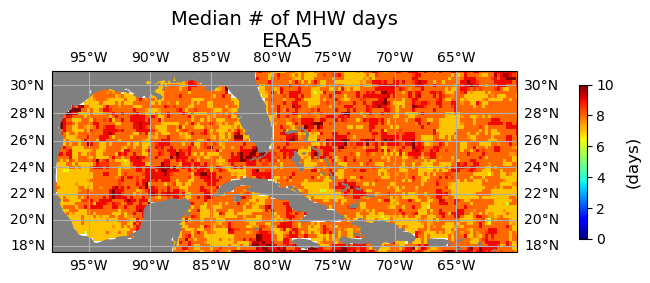

In [24]:
cartopy_plot_single(median_duration, 'jet', '(days)', 
             'Median # of MHW days\n ERA5', vmin=0, vmax=10);#if time res is daily


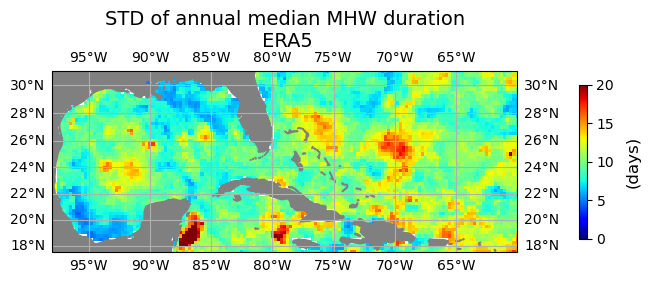

In [23]:
#For each grid cell, it measures how spread out the individual MHW event durations are from the median 
#(or mean) duration of that cell.
cartopy_plot_single(median_duration_std, 'jet', '(days)', 
             "STD of annual median MHW duration\n ERA5", vmin=0, vmax=20);#if time res is daily


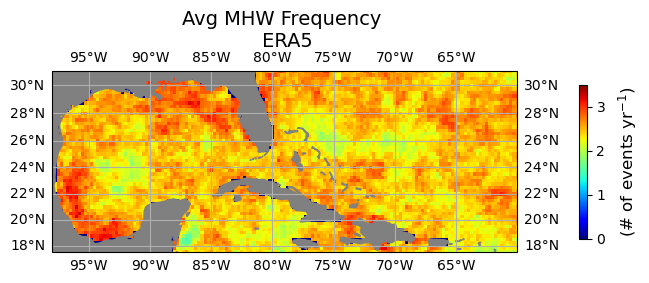

In [11]:
cartopy_plot_single(frequency, 'jet', r'(# of events yr$^{-1}$)', 'Avg MHW Frequency \n ERA5',
                   vmin=0, vmax=3.5);

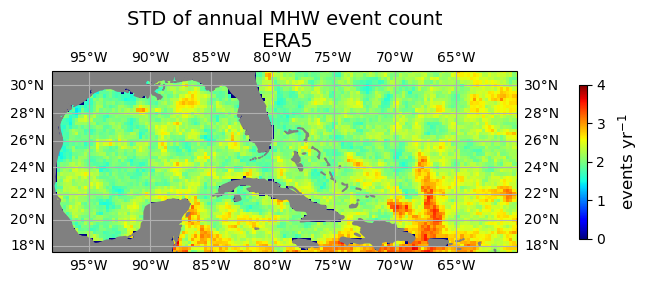

In [21]:
#Interannual standard deviation of annual MHW event counts
#variability of annual event counts.
cartopy_plot_single(event_count_std, 'jet', r'events yr$^{-1}$', 
             'STD of annual MHW event count\n ERA5', vmin=0, vmax=4);
#0–0.5 -> low variability
#0.5–1.5 -> moderate variability
#1.5 -> highly bursty regimes

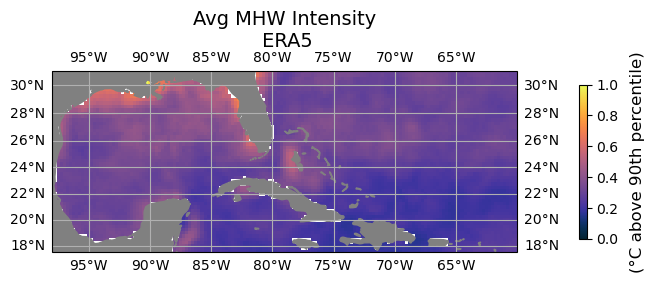

In [26]:
cartopy_plot_single(intensity.mean('time'), cmocean.cm.thermal, '(°C above 90th percentile)', 
             'Avg MHW Intensity\n ERA5', vmin=0, vmax=1); 
#0.2 °C → very weak events (barely above threshold)
#0.5 °C → moderate MHW intensity
#1.0 °C → strong MHWs
#>1.5 °C → extreme events (coastline in GoM are more severe than rest of study region)
#------for bias plots-----
#Bias of 0.05 °C → small
#Bias of 0.1–0.2 °C → moderate
#Bias > 0.3 °C → substantial
#Bias ~0.5 °C → very large error

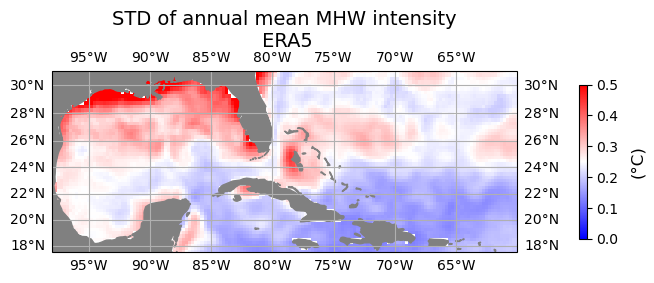

In [28]:
cartopy_plot_single(intensity.std('time'), 'bwr', '(°C)', 
             'STD of annual mean MHW intensity\n ERA5', vmin=0, vmax=0.5); 
#Low std (~0.05) → stable severity each year
#High std (~0.25) → some years mild, some extreme

In [34]:
mean_count = event_count.mean("time")
std_count  = event_count.std("time")
mask = mean_count > 0.3   # or >1 event per ~3 yrs
freq_cv = xr.where(mask, std_count / mean_count, np.nan)
#USE CV TO COMPARE M/O
#cv_bias = freq_cv_model - freq_cv_obs

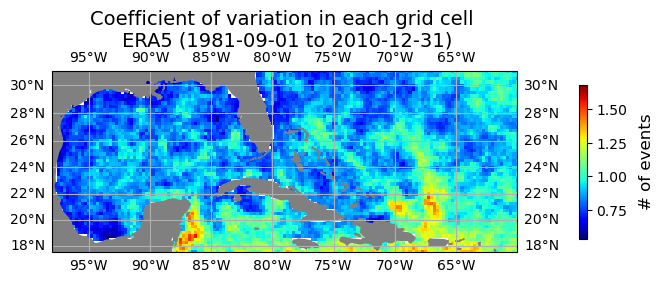

In [35]:
#How regular vs bursty are MHW occurrences?
#low CV -> events every year, stable reoccurance
#high CV -> long quiet periods, occasional clusters of events
#partially explains why mean frequency biases exist
cartopy_plot_single(freq_cv, 'jet', '# of events', 
             'Coefficient of variation in each grid cell \n ERA5 (1981-09-01 to 2010-12-31)')

In [ ]:
%%time 
#--------------------------------------- EVENT COUNTS <20sec------------------------------
# (1) Extract unique coordinates and years from your ERA dataset
latitudes = ex_int_era.latitude.values
longitudes = ex_int_era.longitude.values
years = np.unique(ex_int_era.time.dt.year.values)  # all years in the dataset

# (2) Prepare a list to store records for the DataFrame
records = []
for cell_str, events in events_by_cell_era.items():
    lat, lon = map(float, cell_str.strip("()").split(","))
    # Round lat/lon to match dataset precision
    lat = float(np.round(lat, 3))
    lon = float(np.round(lon, 3))
    # Extract start indices of events
    starts = np.array([start for start, end in events])
    # Map start indices to years
    event_years = ex_int_era.time.dt.year.values[starts]
    # Store each event as a record
    # Record **one row per event**
    records.extend({"latitude": lat,"longitude": lon,"time": int(y),} for y in event_years)

# (3) Create a DataFrame of all events
df = pd.DataFrame(records)

# (4) Ensure all possible combinations of time, lat, lon exist
all_coords = pd.MultiIndex.from_product([years, latitudes, longitudes],
                                        names=["time", "latitude", "longitude"])

df = df.groupby(["time", "latitude", "longitude"]).size().rename("event_count")
df = df.reindex(all_coords, fill_value=0).reset_index()

# (5) Convert to xarray
event_count_yearly_era = df.set_index(["time", "latitude", "longitude"]).to_xarray()["event_count"]

#--------------------------------------- TOTAL MHW DAYS ------------------------------
total_mhw_days_era = event_mask_era.sum(dim="time")

#--------------------------------------- DURATION <2min ------------------------------
# --- Step 0: Precompute years array from ex_int_era ---
years = ex_int_era.time.dt.year.values

# --- Step 1: Compute total number of events ---
total_events = sum(len(events) for events in events_by_cell_era.values())

# --- Step 2: Preallocate arrays ---
lat_arr = np.empty(total_events, dtype=float)
lon_arr = np.empty(total_events, dtype=float)
time_arr = np.empty(total_events, dtype=int)
event_arr = np.empty(total_events, dtype=int)
duration_arr = np.empty(total_events, dtype=int)

# --- Step 3: Fill arrays ---
idx = 0
for cell_str, events in events_by_cell_era.items():
    if not events:
        continue
    
    lat, lon = map(float, cell_str.strip("()").split(","))
    starts, ends = zip(*events)
    starts = np.array(starts)
    ends = np.array(ends)
    
    n_events = len(events)
    
    lat_arr[idx:idx+n_events] = lat
    lon_arr[idx:idx+n_events] = lon
    time_arr[idx:idx+n_events] = years[starts]          # preserve time for temporal stats
    event_arr[idx:idx+n_events] = np.arange(n_events)
    duration_arr[idx:idx+n_events] = ends - starts + 1
    
    idx += n_events

# --- Step 4: Build xarray DataArray ---
duration_da = xr.DataArray(duration_arr, 
                           coords={ "event_dim": np.arange(total_events), "latitude": ("event_dim", lat_arr), 
                                    "longitude": ("event_dim", lon_arr), "time": ("event_dim", time_arr), 
                                    "event": ("event_dim", event_arr)},
                           dims=["event_dim"],
                           name="duration")

# --- Version 1: Median per cell across all events (ignoring time) ---
median_duration_per_cell = duration_da.groupby(["latitude", "longitude"]).median(dim="event_dim")
median_duration_std = duration_da.groupby(["latitude", "longitude"]).std(dim='event_dim')
# --- Version 2: Median per cell per year (preserving time dimension) ---
#median_duration_per_cell_yearly = duration_da.groupby(["time", "latitude", "longitude"]).median(dim="event_dim")

# --- Temporal statistics across years ---
#median_duration_mean = median_duration_per_cell_yearly.mean(dim="time")   # mean over years
#median_duration_std  = median_duration_per_cell_yearly.std(dim="time")    # std over years

#--------------------------------------- MHW Temperatures ------------------------------
mhw_events_era = detrended_era.where(event_mask_era)
mean_mhw_temp_era = mhw_events_era.mean(dim="time")

#--------------------------------------- Frequency ------------------------------
years_era = detrended_era.time.dt.year.values
nyears_era = np.unique(years_era).size #total time period
event_freq_era = event_count_era / nyears_era

#--------------------------------------- Intensity ------------------------------
mhw_intensity_era = (mhw_events_era - threshold_era).mean(dim="time")

In [10]:
event_count_era = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/ERA5/map_vars/event_count_era.nc', chunks={})
total_mhw_days_era = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/ERA5/map_vars/total_mhw_days_era.nc', chunks={})
mean_duration_era = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/ERA5/map_vars/mean_duration_era.nc', chunks={})
median_duration_era = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/ERA5/map_vars/median_duration_era.nc', chunks={})
max_duration_era = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/ERA5/map_vars/max_duration_era.nc', chunks={})
mean_mhw_temp_era = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/ERA5/map_vars/mean_mhw_temp_era.nc', chunks={})
event_freq_era = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/ERA5/map_vars/event_freq_era.nc', chunks={})
mhw_intensity_era= xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/ERA5/map_vars/mhw_intensity_era.nc', chunks={})

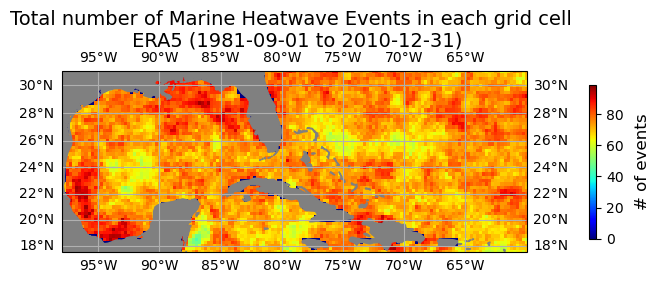

In [5]:
cartopy_plot_single(event_count_era, 'jet', '# of events', 
             'Total number of Marine Heatwave Events in each grid cell \n ERA5 (1981-09-01 to 2010-12-31)')

In [ ]:
cartopy_plot_single(ev_ct_oi_ng, 'jet', '# of events', 
             'Total number of Marine Heatwave Events in each grid cell \n OISST (1981-09-01 to 2010-12-31)')

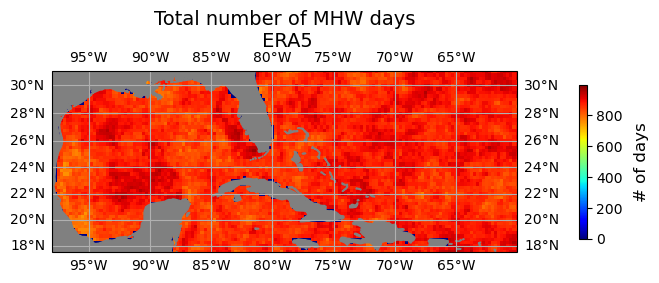

In [6]:
cartopy_plot_single(total_mhw_days_era, 'jet', '# of days', 
             'Total number of MHW days\n ERA5');#if time res is daily


In [ ]:
cartopy_plot_single(tot_mhw_days_oi_ng, 'jet', '# of days', 
             'Total number of MHW days\n OISST');#if time res is daily


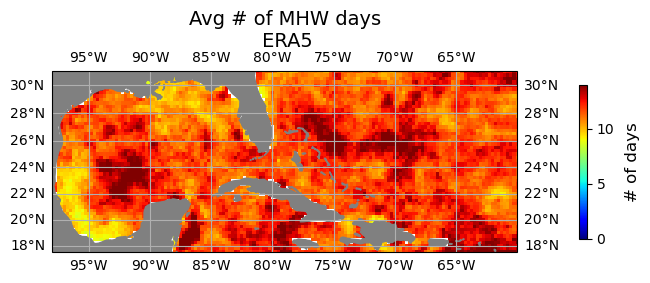

In [7]:
cartopy_plot_single(mean_duration_era, 'jet', '# of days', 
             'Avg # of MHW days\n ERA5',vmin=0, vmax=14,);#if time res is daily


In [ ]:
cartopy_plot_single(mean_dur_oi_ng, 'jet', '# of days', 
             'Avg # of MHW days\n OISST')#,vmin=0, vmax=14,);#if time res is daily


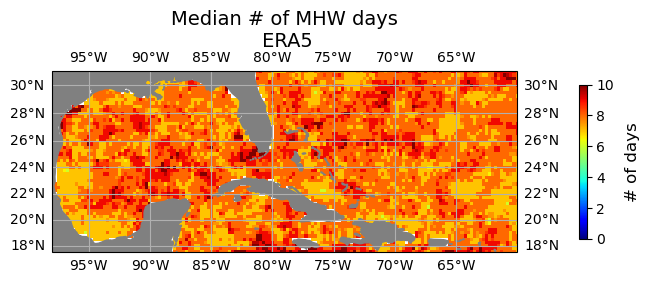

In [8]:
cartopy_plot_single(median_duration_era, 'jet', '# of days', 
             'Median # of MHW days\n ERA5', vmin=0, vmax=10);#if time res is daily


In [ ]:
cartopy_plot_single(med_dur_oi_ng, 'jet', '# of days', 
             'Median # of MHW days\n OISST');#if time res is daily


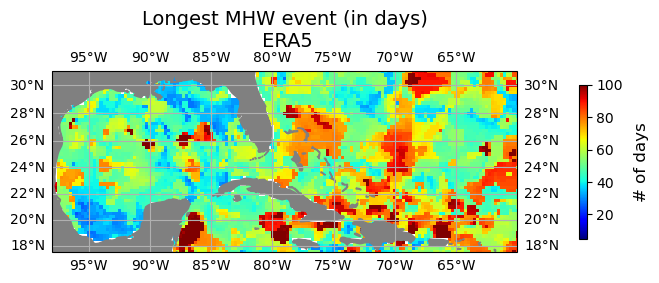

In [9]:
cartopy_plot_single(max_duration_era, 'jet', '# of days', 
             'Longest MHW event (in days)\n ERA5', vmin=5, vmax=100);

In [ ]:
cartopy_plot_single(max_dur_oi_ng, 'jet', '# of days', 
             'Longest MHW event (in days)\n OISST', vmin=5, vmax=100);

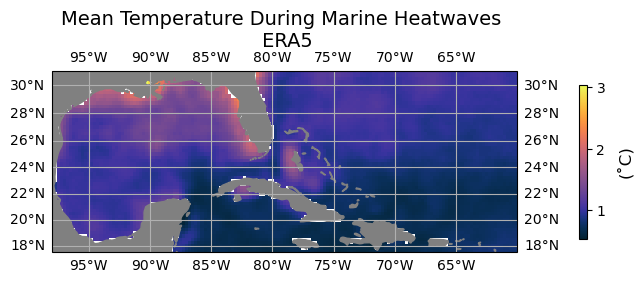

In [10]:
cartopy_plot_single(mean_mhw_temp_era, cmocean.cm.thermal, '(˚C)', 
             'Mean Temperature During Marine Heatwaves \n ERA5',);

In [ ]:
cartopy_plot_single(mean_mhw_tmp_oi_ng, cmocean.cm.thermal, '(˚C)', 
             'Mean Temperature During Marine Heatwaves \n OISST',);

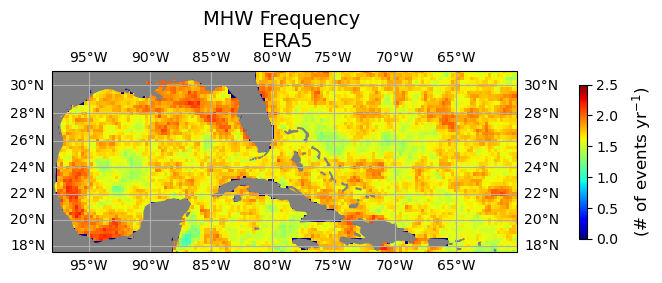

In [11]:
cartopy_plot_single(event_freq_era, 'jet', r'(# of events yr$^{-1}$)', 'MHW Frequency \n ERA5',
                   vmin=0, vmax=2.5);

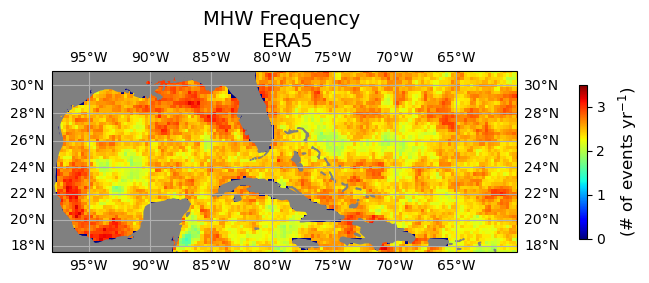

In [12]:
cartopy_plot_single(event_freq_era, 'jet', r'(# of events yr$^{-1}$)', 'MHW Frequency \n ERA5',
                   vmin=0, vmax=3.5);

In [ ]:
cartopy_plot_single(ev_freq_oi_ng, 'jet', r'(# of events yr$^{-1}$)', 'MHW Frequency \n OISST', 
                   vmin=0, vmax=2.5);

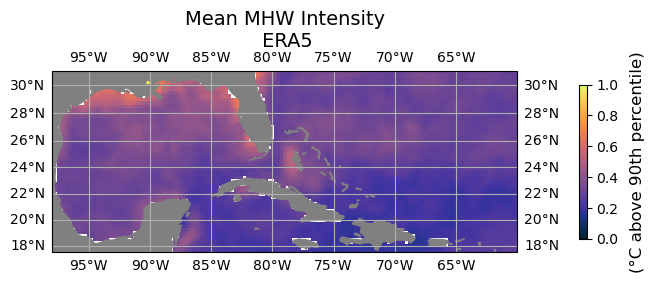

In [12]:
cartopy_plot_single(mhw_intensity_era, cmocean.cm.thermal, '(°C above 90th percentile)', 
             'Mean MHW Intensity\n ERA5', vmin=0, vmax=1); 

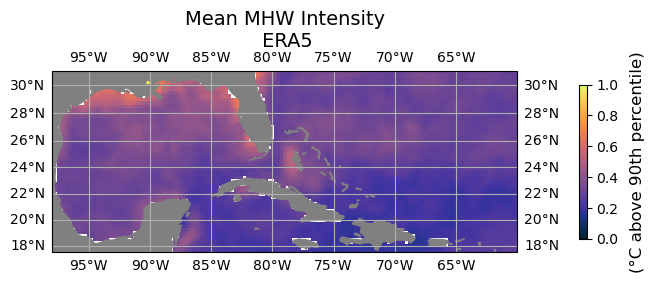

In [15]:
cartopy_plot_single(mhw_intensity_era.mean('time'), cmocean.cm.thermal, '(°C above 90th percentile)', 
             'Mean MHW Intensity\n ERA5', vmin=0, vmax=1); 

In [ ]:
cartopy_plot_single(mhw_int_oi_ng, cmocean.cm.thermal, '(°C above 90th percentile)', 
             'Mean MHW Intensity\n OISST', vmin=0, vmax=1); 

## OISST
Vars needed:
- detrended_intime
- threshold
- events_by_cell
- event_mask
- ex_int_oi

In [4]:
%%time 
#--------------------------------------- EVENT COUNTS ------------------------------
# create empty array to get spatial and meta data
event_count_oi = xr.zeros_like(ex_int_oi.isel(time=0), dtype=int) #da of 0s
#for key (lat/lon), events (start/stop indices) in da dictionary:
#empty_da.loc[dict((lat, lon))] = len(all events in that grid cell)
for cell_str, events in events_by_cell_oi.items(): #items are the lat/lon pairs
    lat, lon = map(float, cell_str.strip("()").split(","))
    event_count_oi.loc[dict(lat=lat, lon=lon)] = len(events)

#--------------------------------------- TOTAL MHW DAYS ------------------------------
total_mhw_days_oi = event_mask_oi.sum(dim="time")

#--------------------------------------- DURATION ------------------------------
records_oi = []
for cell_str, events in events_by_cell_oi.items():
    lat, lon = map(float, cell_str.strip("()").split(","))
    for i, (start, end) in enumerate(events):
        records_oi.append({"lat": lat, "lon": lon, "event": i, "duration": end - start + 1})

df = pd.DataFrame(records_oi)
duration_da = (df.set_index(["lat", "lon", "event"]).to_xarray())["duration"]

mean_duration_oi = duration_da.mean(dim="event")
median_duration_oi = duration_da.median(dim="event")
max_duration_oi = duration_da.max(dim="event")

#--------------------------------------- MHW Temperatures ------------------------------
mhw_events_oi = detrended_oi.where(event_mask_oi)
mean_mhw_temp_oi = mhw_events_oi.mean(dim="time")

#--------------------------------------- Frequency ------------------------------
years_oi = detrended_oi.time.dt.year.values
nyears_oi = np.unique(years_oi).size #total time period
event_freq_oi = event_count_oi / nyears_oi

#--------------------------------------- Intensity ------------------------------
mhw_intensity_oi = (mhw_events_oi - threshold_oi).mean(dim="time")

CPU times: user 6min 46s, sys: 1.58 s, total: 6min 48s
Wall time: 6min 52s


In [5]:
event_count_oi = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/OISST/map_vars/event_count_oi.nc', chunks={})
total_mhw_days_oi = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/OISST/map_vars/total_mhw_days_oi.nc', chunks={})
mean_duration_oi = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/OISST/map_vars/mean_duration_oi.nc', chunks={})
median_duration_oi = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/OISST/map_vars/median_duration_oi.nc', chunks={})
max_duration_oi = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/OISST/map_vars/max_duration_oi.nc', chunks={})
mean_mhw_temp_oi = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/OISST/map_vars/mean_mhw_temp_oi.nc', chunks={})
event_freq_oi= xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/OISST/map_vars/event_freq_oi.nc', chunks={})
mhw_intensity_oi= xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/OISST/map_vars/mhw_intensity_oi.nc', chunks={})

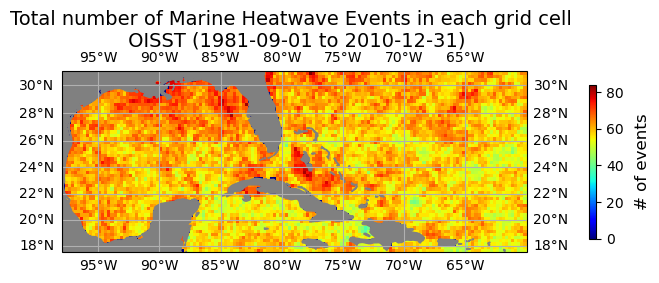

In [21]:
cartopy_plot_single(event_count_oi, 'jet', '# of events', 
             'Total number of Marine Heatwave Events in each grid cell \n OISST (1981-09-01 to 2010-12-31)')

In [ ]:
cartopy_plot_single(ev_ct_oi_ng, 'jet', '# of events', 
             'Total number of Marine Heatwave Events in each grid cell \n OISST (1981-09-01 to 2010-12-31)')

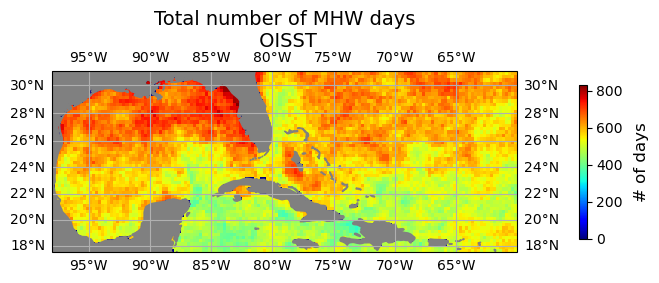

In [22]:
cartopy_plot_single(total_mhw_days_oi, 'jet', '# of days', 
             'Total number of MHW days\n OISST');#if time res is daily


In [ ]:
cartopy_plot_single(tot_mhw_days_oi_ng, 'jet', '# of days', 
             'Total number of MHW days\n OISST');#if time res is daily


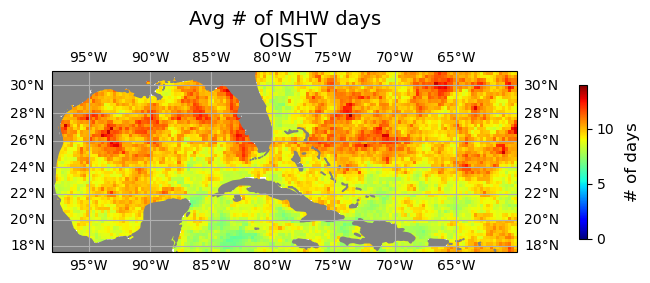

In [23]:
cartopy_plot_single(mean_duration_oi, 'jet', '# of days', 
             'Avg # of MHW days\n OISST',vmin=0, vmax=14,);#if time res is daily


In [ ]:
cartopy_plot_single(mean_dur_oi_ng, 'jet', '# of days', 
             'Avg # of MHW days\n OISST')#,vmin=0, vmax=14,);#if time res is daily


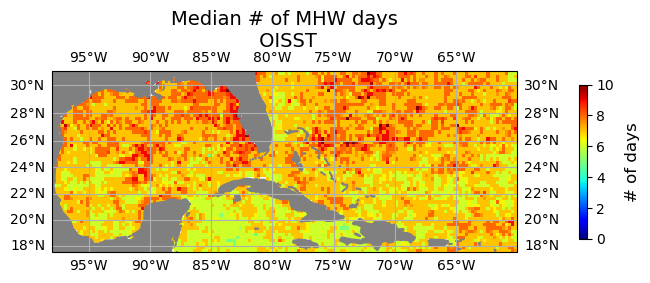

In [24]:
cartopy_plot_single(median_duration_oi, 'jet', '# of days', 
             'Median # of MHW days\n OISST', vmin=0, vmax=10);#if time res is daily


In [ ]:
cartopy_plot_single(med_dur_oi_ng, 'jet', '# of days', 
             'Median # of MHW days\n OISST');#if time res is daily


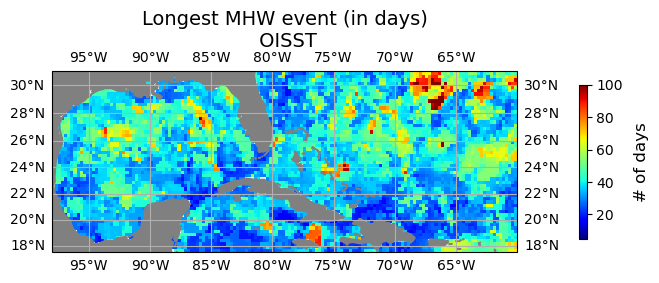

In [25]:
cartopy_plot_single(max_duration_oi, 'jet', '# of days', 
             'Longest MHW event (in days)\n OISST', vmin=5, vmax=100);

In [ ]:
cartopy_plot_single(max_dur_oi_ng, 'jet', '# of days', 
             'Longest MHW event (in days)\n OISST', vmin=5, vmax=100);

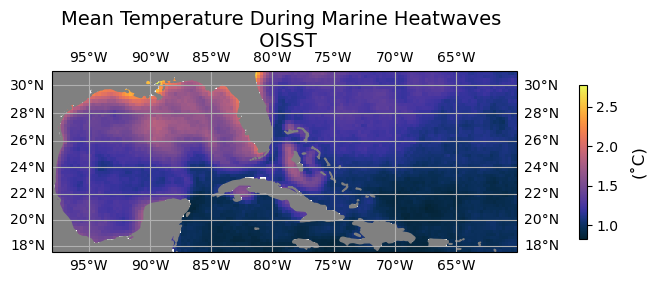

In [26]:
cartopy_plot_single(mean_mhw_temp_oi, cmocean.cm.thermal, '(˚C)', 
             'Mean Temperature During Marine Heatwaves \n OISST',);

In [ ]:
cartopy_plot_single(mean_mhw_tmp_oi_ng, cmocean.cm.thermal, '(˚C)', 
             'Mean Temperature During Marine Heatwaves \n OISST',);

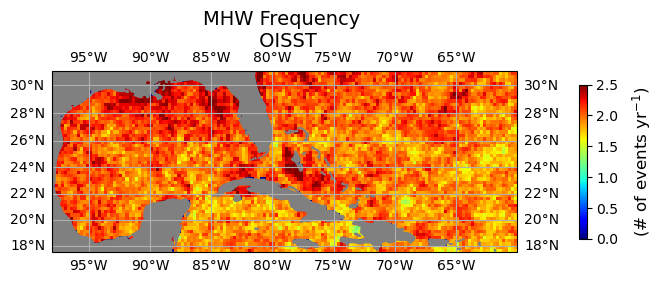

In [27]:
cartopy_plot_single(event_freq_oi, 'jet', r'(# of events yr$^{-1}$)', 'MHW Frequency \n OISST',
                   vmin=0, vmax=2.5);

In [ ]:
cartopy_plot_single(ev_freq_oi_ng, 'jet', r'(# of events yr$^{-1}$)', 'MHW Frequency \n OISST', 
                   vmin=0, vmax=2.5);

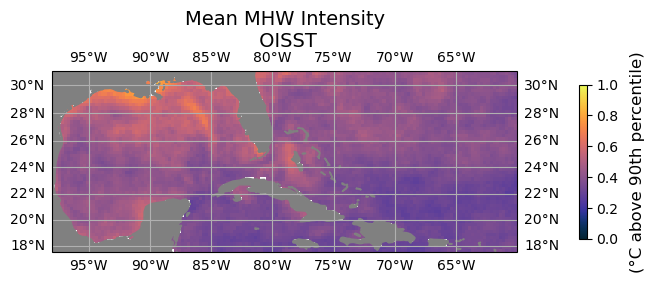

In [28]:
cartopy_plot_single(mhw_intensity_oi, cmocean.cm.thermal, '(°C above 90th percentile)', 
             'Mean MHW Intensity\n OISST', vmin=0, vmax=1); 

In [ ]:
cartopy_plot_single(mhw_int_oi_ng, cmocean.cm.thermal, '(°C above 90th percentile)', 
             'Mean MHW Intensity\n OISST', vmin=0, vmax=1); 

## SPEAR-LO

In [6]:
#detrended SSTs
files = sorted(glob.glob('/work5/stb/MHW-gfdl/SPEAR/vars/SPEAR-LO/detrended/detrended_anom_intime_spear_lo*.nc'))
detrended_splo = []
for f in files:
    ds = xr.open_dataset(f, chunks={})
    da = next(iter(ds.data_vars.values()))
    #take the # in filename and add it to darr name
    ens = os.path.basename(f).split('_lo')[-1].split('.nc')[0] 
    da = da.rename(f'SST_ens{ens}')
    detrended_splo.append(da)

In [7]:
#darr of 1s/0s of SSTs>90th percentile
files = sorted(glob.glob('/work5/stb/MHW-gfdl/SPEAR/vars/SPEAR-LO/exceedance/ex_int_splo*.nc'))
ex_int_splo = []
for f in files:
    ds = xr.open_dataset(f, chunks={})
    da = next(iter(ds.data_vars.values()))
    #take the # in filename and add it to darr name
    ens = os.path.basename(f).split('_lo')[-1].split('.nc')[0] 
    da = da.rename(f'{ens}')
    ex_int_splo.append(da)

In [8]:
#darr of 90th percentile SSTs
files = sorted(glob.glob('/work5/stb/MHW-gfdl/SPEAR/vars/SPEAR-LO/exceedance/threshold_splo*.nc'))
threshold_splo = []
for f in files:
    ds = xr.open_dataset(f, chunks={})
    da = next(iter(ds.data_vars.values()))
    #take the # in filename and add it to darr name
    ens = os.path.basename(f).split('_lo')[-1].split('.nc')[0] 
    da = da.rename(f'{ens}')
    threshold_splo.append(da)

In [9]:
#darr following criteria (>=90th, >=5 consec days, >=3 day gaps)
files = sorted(glob.glob('/work5/stb/MHW-gfdl/SPEAR/vars/SPEAR-LO/events/event_mask_splo*.nc'))
event_mask_splo = []
for f in files:
    ds = xr.open_dataset(f, chunks={})
    da = next(iter(ds.data_vars.values()))
    #take the # in filename and add it to darr name
    ens = os.path.basename(f).split('_lo')[-1].split('.nc')[0] 
    da = da.rename(f'{ens}')
    event_mask_splo.append(da)

In [10]:
event_mask_splo

[<xarray.DataArray 'event_mask_splo01' (time: 10714, yT: 26, xT: 83)> Size: 23MB
 dask.array<open_dataset-__xarray_dataarray_variable__, shape=(10714, 26, 83), dtype=bool, chunksize=(10714, 26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * time       (time) object 86kB 1981-09-01 12:00:00 ... 2010-12-31 12:00:00
   * xT         (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT         (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     month      (time) int64 86kB dask.array<chunksize=(10714,), meta=np.ndarray>
     quantile   float64 8B ...
     dayofyear  (time) int64 86kB dask.array<chunksize=(10714,), meta=np.ndarray>,
 <xarray.DataArray 'event_mask_splo02' (time: 10714, yT: 26, xT: 83)> Size: 23MB
 dask.array<open_dataset-__xarray_dataarray_variable__, shape=(10714, 26, 83), dtype=bool, chunksize=(10714, 26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * time       (time) object 86kB 1981-09-01 12:00:00 ... 2010-12-31 12:00:00
   * xT    

In [11]:
with open('/work5/stb/MHW-gfdl/SPEAR/vars/SPEAR-LO/events/events_by_cell_splo.json', 'r') as json_file:
    events_by_cell_splo = json.load(json_file)

In [12]:
%%time
#--------------------------------------- EVENT COUNTS <2min ------------------------------
event_counts_splo = []

for da, events_by_cell in zip(ex_int_splo, events_by_cell_splo):
    # create empty event-count array for this DA
    event_count = xr.zeros_like(da.isel(time=0), dtype=int).rename(f'event_count_ens{da.name[-2:]}')
    # fill it using the corresponding dictionary
    for cell_str, events in events_by_cell.items():
        lat, lon = map(float, cell_str.strip("()").split(","))
        event_count.loc[dict(yT=lat, xT=lon)] = len(events)

    event_counts_splo.append(event_count)

CPU times: user 1min 10s, sys: 329 ms, total: 1min 11s
Wall time: 1min 11s


In [13]:
event_counts_splo

[<xarray.DataArray 'event_count_ens01' (yT: 26, xT: 83)> Size: 17kB
 dask.array<setitem, shape=(26, 83), dtype=int64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
     time       object 8B 1981-09-01 12:00:00
   * xT         (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT         (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     month      int64 8B dask.array<chunksize=(), meta=np.ndarray>
     quantile   float64 8B ...
     dayofyear  int64 8B dask.array<chunksize=(), meta=np.ndarray>,
 <xarray.DataArray 'event_count_ens02' (yT: 26, xT: 83)> Size: 17kB
 dask.array<setitem, shape=(26, 83), dtype=int64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
     time       object 8B 1981-09-01 12:00:00
   * xT         (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT         (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     month      int64 8B dask.array<chunksize=(), meta=np.ndarray>
   

In [14]:
%%time
#--------------------------------------- TOTAL MHW DAYS <1sec ------------------------------
total_mhw_days = []
for da in event_mask_splo:
    total_mhw_days.append(da.sum(dim="time"))

CPU times: user 45.7 ms, sys: 2.98 ms, total: 48.7 ms
Wall time: 48.5 ms


In [15]:
total_mhw_days

[<xarray.DataArray 'event_mask_splo01' (yT: 26, xT: 83)> Size: 17kB
 dask.array<sum-aggregate, shape=(26, 83), dtype=int64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     quantile  float64 8B ...,
 <xarray.DataArray 'event_mask_splo02' (yT: 26, xT: 83)> Size: 17kB
 dask.array<sum-aggregate, shape=(26, 83), dtype=int64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     quantile  float64 8B ...,
 <xarray.DataArray 'event_mask_splo03' (yT: 26, xT: 83)> Size: 17kB
 dask.array<sum-aggregate, shape=(26, 83), dtype=int64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -1

In [16]:
#sanity check 
len(events_by_cell_splo)

30

In [17]:
%%time
#--------------------------------------- DURATION <10 sec (xr method) ------------------------------
# Get all unique cells from the first ensemble member
cells = list(events_by_cell_splo[0].keys())
lats, lons = zip(*(map(float, c.strip("()").split(",")) for c in cells))

# Convert to sorted unique lat/lon for grid
unique_lats = np.unique(lats)
unique_lons = np.unique(lons)

# Create mapping from cell string to grid indices
lat_idx = {lat: i for i, lat in enumerate(unique_lats)}
lon_idx = {lon: i for i, lon in enumerate(unique_lons)}

# Dimensions
n_ens = len(events_by_cell_splo)
n_lat = len(unique_lats)
n_lon = len(unique_lons)
max_events = max(len(events) for member in events_by_cell_splo for events in member.values())

# Preallocate array: ensemble × lat × lon × event
data = np.full((n_ens, n_lat, n_lon, max_events), np.nan)

# Fill the array
for ei, member in enumerate(events_by_cell_splo):
    for cell_str, events in member.items():
        lat, lon = map(float, cell_str.strip("()").split(","))
        li, lj = lat_idx[lat], lon_idx[lon]
        durations = [end - start + 1 for start, end in events]
        data[ei, li, lj, :len(durations)] = durations

# Create xarray DataArray
duration_da = xr.DataArray(data, dims=["ensemble", "yT", "xT", "event"],
                           coords={"ensemble": np.arange(n_ens), "yT": unique_lats, "xT": unique_lons})

# Compute per-cell statistics over events
mean_duration = duration_da.mean(dim="event", skipna=True)
median_duration = duration_da.median(dim="event", skipna=True)
max_duration = duration_da.max(dim="event", skipna=True)

# Compute statistics across ensembles
mean_duration_across_ensemble = mean_duration.mean(dim="ensemble")
median_duration_across_ensemble = median_duration.median(dim="ensemble")
max_duration_across_ensemble = max_duration.max(dim="ensemble")

CPU times: user 10.1 s, sys: 497 ms, total: 10.6 s
Wall time: 10.4 s


In [18]:
n_ens

30

In [19]:
duration_da

<xarray.DataArray (ensemble: 30, yT: 26, xT: 83, event: 93)> Size: 48MB
array([[[[ 12.,  31.,   5., ...,  nan,  nan,  nan],
         [ 12.,  22.,   5., ...,  nan,  nan,  nan],
         [ 27.,   8.,  13., ...,  nan,  nan,  nan],
         ...,
         [  5.,   9.,   5., ...,  nan,  nan,  nan],
         [  5.,   8.,   5., ...,  nan,  nan,  nan],
         [ 10.,   8.,   5., ...,  nan,  nan,  nan]],

        [[  9.,  26.,  10., ...,  nan,  nan,  nan],
         [ 12.,  26.,  10., ...,  nan,  nan,  nan],
         [ 20.,   7.,  10., ...,  nan,  nan,  nan],
         ...,
         [  5.,   9.,  17., ...,  nan,  nan,  nan],
         [  5.,   8.,   6., ...,  nan,  nan,  nan],
         [  5.,   8.,   5., ...,  nan,  nan,  nan]],

        [[ 17.,   5.,   7., ...,  nan,  nan,  nan],
         [ 17.,   6.,  10., ...,  nan,  nan,  nan],
         [ 23.,   9.,  12., ...,  nan,  nan,  nan],
         ...,
...
         ...,
         [  5.,  35.,  14., ...,  nan,  nan,  nan],
         [ 27.,  14.,   5., ...,  nan,  nan,  nan],
         [ 31.,  20.,  15., ...,  nan,  nan,  nan]],

        [[ nan,  nan,  nan, ...,  nan,  nan,  nan],
         [ nan,  nan,  nan, ...,  nan,  nan,  nan],
         [ nan,  nan,  nan, ...,  nan,  nan,  nan],
         ...,
         [ 63.,  12.,   6., ...,  nan,  nan,  nan],
         [  6.,  61.,   7., ...,  nan,  nan,  nan],
         [  9.,  12.,   6., ...,  nan,  nan,  nan]],

        [[ nan,  nan,  nan, ...,  nan,  nan,  nan],
         [ nan,  nan,  nan, ...,  nan,  nan,  nan],
         [ nan,  nan,  nan, ...,  nan,  nan,  nan],
         ...,
         [ 10.,  79.,  19., ...,  nan,  nan,  nan],
         [ 78.,   9.,  17., ...,  nan,  nan,  nan],
         [ 66.,  16.,   5., ...,  nan,  nan,  nan]]]])
Coordinates:
  * ensemble  (ensemble) int64 240B 0 1 2 3 4 5 6 7 ... 22 23 24 25 26 27 28 29
  * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
  * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
Dimensions without coordinates: event

In [20]:
%%time 
#--------------------------------------- MHW Temperatures <2sec ------------------------------mhw_events = []
mhw_events = [] #detrended SSTs during mhw events
mean_mhw_temp = [] #time-avg detrended SSTs of all MHW events at each grid cell
for da, mask in zip(detrended_splo, event_mask_splo):
    mhw = da.where(mask)
    mean_temp = mhw.mean(dim="time")
    
    mhw_events.append(mhw)
    mean_mhw_temp.append(mean_temp)

CPU times: user 2.08 s, sys: 65.1 ms, total: 2.15 s
Wall time: 2.29 s


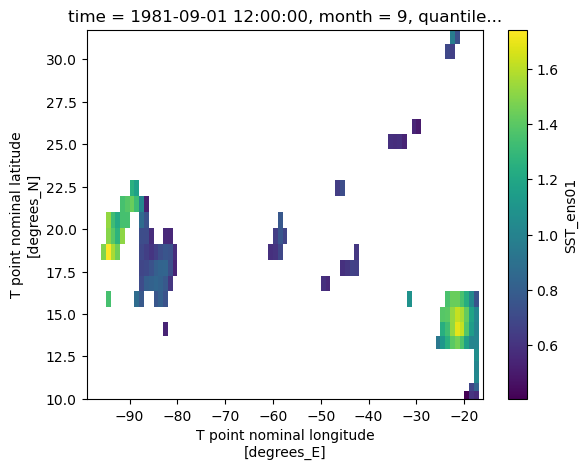

In [19]:
mhw_events[0][0].plot()

In [20]:
mean_mhw_temp

[<xarray.DataArray 'SST_ens01' (yT: 26, xT: 83)> Size: 17kB
 dask.array<mean_agg-aggregate, shape=(26, 83), dtype=float64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     quantile  float64 8B ...,
 <xarray.DataArray 'SST_ens02' (yT: 26, xT: 83)> Size: 17kB
 dask.array<mean_agg-aggregate, shape=(26, 83), dtype=float64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     quantile  float64 8B ...,
 <xarray.DataArray 'SST_ens03' (yT: 26, xT: 83)> Size: 17kB
 dask.array<mean_agg-aggregate, shape=(26, 83), dtype=float64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5

In [21]:
%%time
#--------------------------------------- Frequency <1sec ------------------------------
years = detrended_splo[0].time.dt.year.values
nyears = np.unique(years).size #total time period
# compute event frequency for all ensemble members
event_freq_splo = [da_events / nyears for da_events in event_counts_splo]

CPU times: user 45.5 ms, sys: 14 ms, total: 59.5 ms
Wall time: 58.7 ms


In [22]:
%%time
#--------------------------------------- Intensity <1sec------------------------------
mhw_intensity_splo = []
for mhws, thresh in zip(mhw_events, threshold_splo):
    intensity = (mhws - thresh).mean(dim="time").rename(f'intensity_ens{mhws.name[-2:]}')
    mhw_intensity_splo.append(intensity)

CPU times: user 878 ms, sys: 16.9 ms, total: 895 ms
Wall time: 899 ms


### Plots

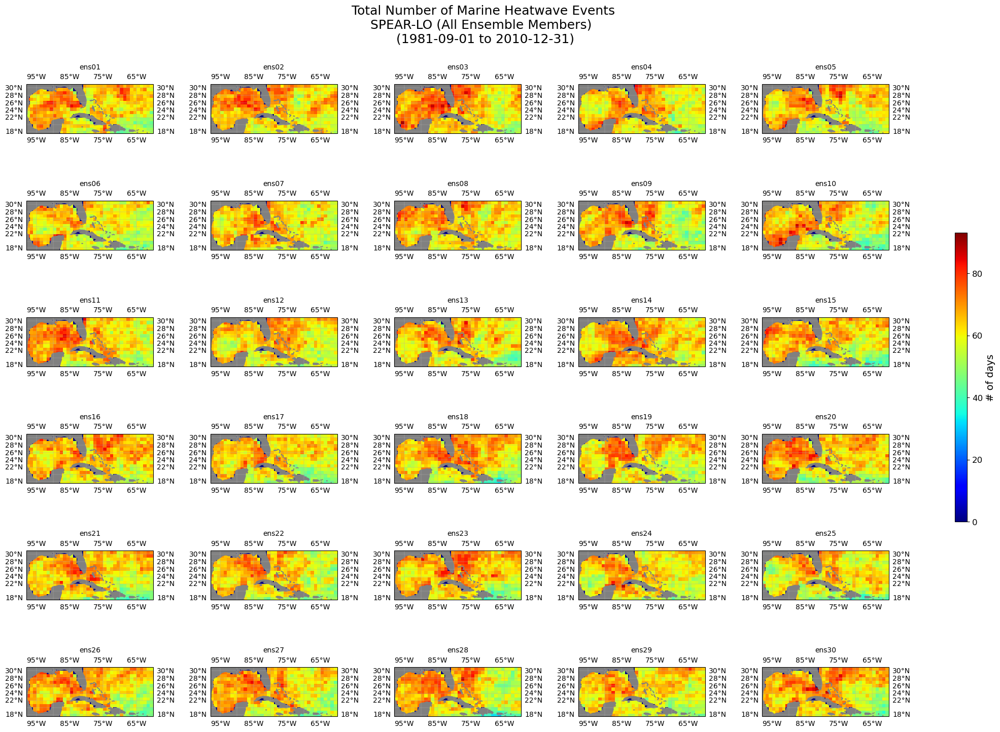

CPU times: user 39.6 s, sys: 2.3 s, total: 41.9 s
Wall time: 40.9 s


In [23]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

# ---- shared normalization (CRITICAL for colorbar) ----
# temporarily stack ensemble members into one DataArray to get min/max
stacked = xr.concat(event_counts_splo, dim="ensemble") #xr creates an 'ens' dim to stack da's along
vmin = stacked.min().compute().item()
vmax = stacked.max().compute().item()
norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(event_counts_splo[i], cmap_choice='jet', var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # move: [to right, it up, make thinner, shorter]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Total Number of Marine Heatwave Events\nSPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

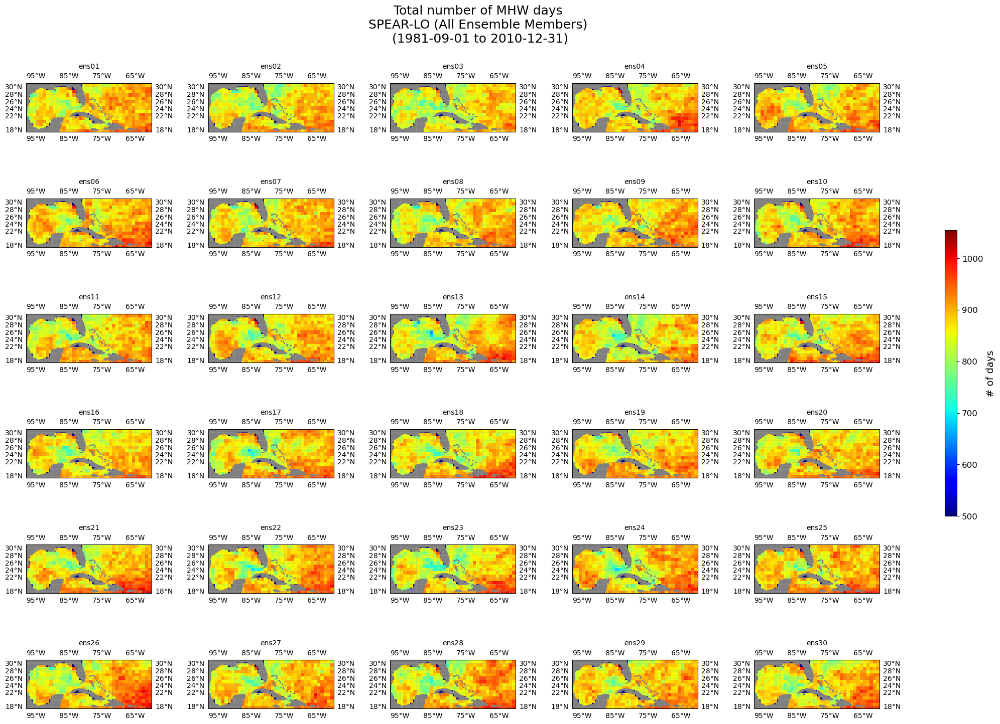

CPU times: user 13.7 s, sys: 2.22 s, total: 15.9 s
Wall time: 31.7 s


In [24]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

# ---- shared normalization (CRITICAL for colorbar) ----
# temporarily stack ensemble members into one DataArray to get min/max
stacked = xr.concat(total_mhw_days, dim="ensemble")
vmin = stacked.min().compute().item()
vmax = stacked.max().compute().item()
norm = mcolors.Normalize(vmin=500, vmax=vmax)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(total_mhw_days[i], cmap_choice='jet', var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # move: [to right, it up, make thinner, shorter]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Total number of MHW days\n SPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

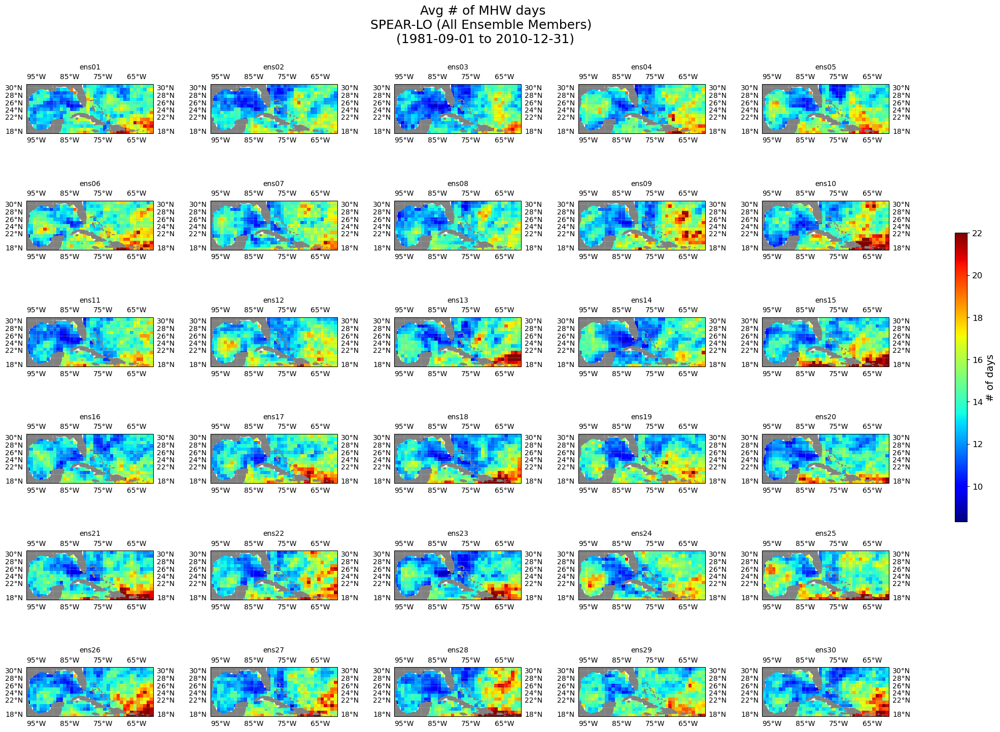

CPU times: user 12.1 s, sys: 55.1 ms, total: 12.2 s
Wall time: 12.2 s


In [25]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

# ---- shared normalization (CRITICAL for colorbar) ----
# temporarily stack ensemble members into one DataArray to get min/max
vmin = mean_duration.min().item()
vmax = mean_duration.max().item()
norm = mcolors.Normalize(vmin=vmin, vmax=22)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(mean_duration.isel(ensemble=i), cmap_choice='jet', var_title=title, 
                      norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # move: [to right, it up, make thinner, shorter]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Avg # of MHW days\nSPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

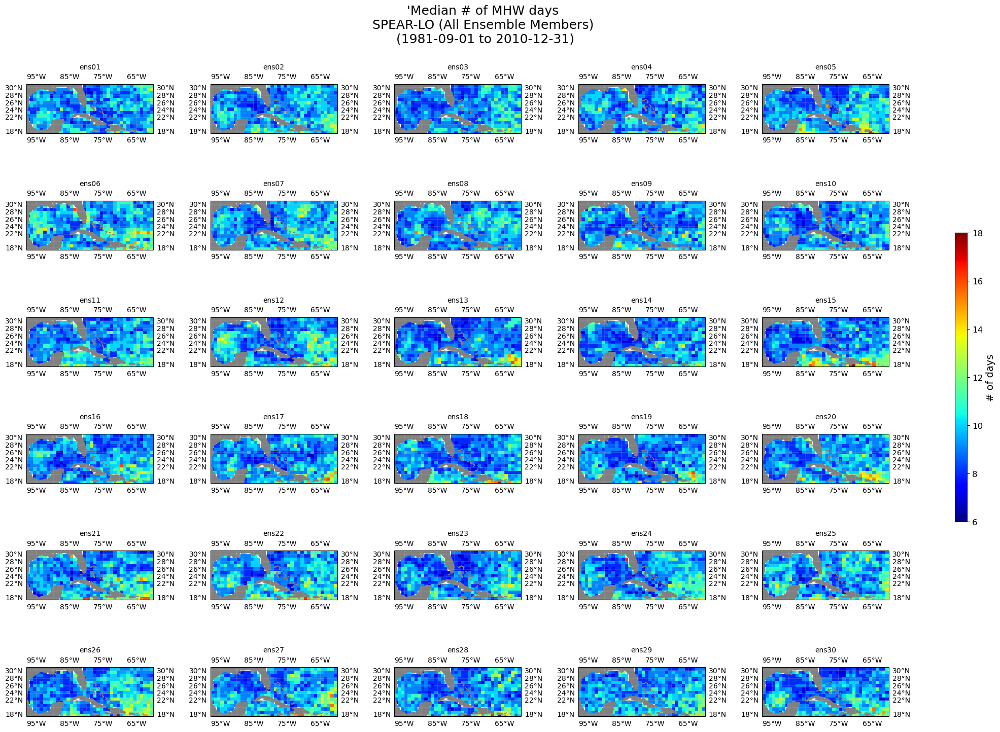

CPU times: user 11.4 s, sys: 41.2 ms, total: 11.5 s
Wall time: 11.5 s


In [26]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

# ---- shared normalization (CRITICAL for colorbar) ----
# temporarily stack ensemble members into one DataArray to get min/max
vmin = median_duration.min().item()
vmax = median_duration.max().item()
norm = mcolors.Normalize(vmin=6, vmax=18) #extreme outliers skew cmap so manually enter values

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(median_duration.isel(ensemble=i), cmap_choice='jet', var_title=title, 
                      norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # move: [to right, it up, make thinner, shorter]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("'Median # of MHW days\n SPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

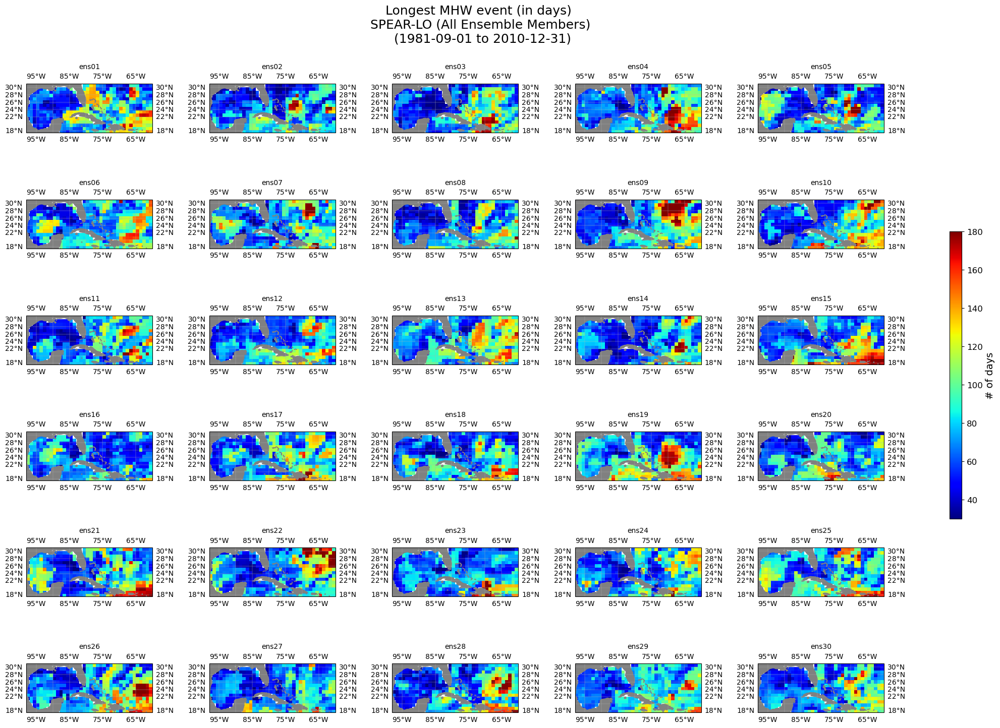

CPU times: user 11.5 s, sys: 49.3 ms, total: 11.5 s
Wall time: 11.5 s


In [27]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

# ---- shared normalization (CRITICAL for colorbar) ----
# temporarily stack ensemble members into one DataArray to get min/max
vmin = max_duration.min().item()
vmax = max_duration.max().item()
norm = mcolors.Normalize(vmin=30, vmax=180) #extreme outliers skew cmap so manually enter values

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(max_duration.isel(ensemble=i), cmap_choice='jet', var_title=title, 
                      norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
#move[to right, it up, make thinner, shorter][left, bottom, width, height]
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) 
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Longest MHW event (in days) \n SPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

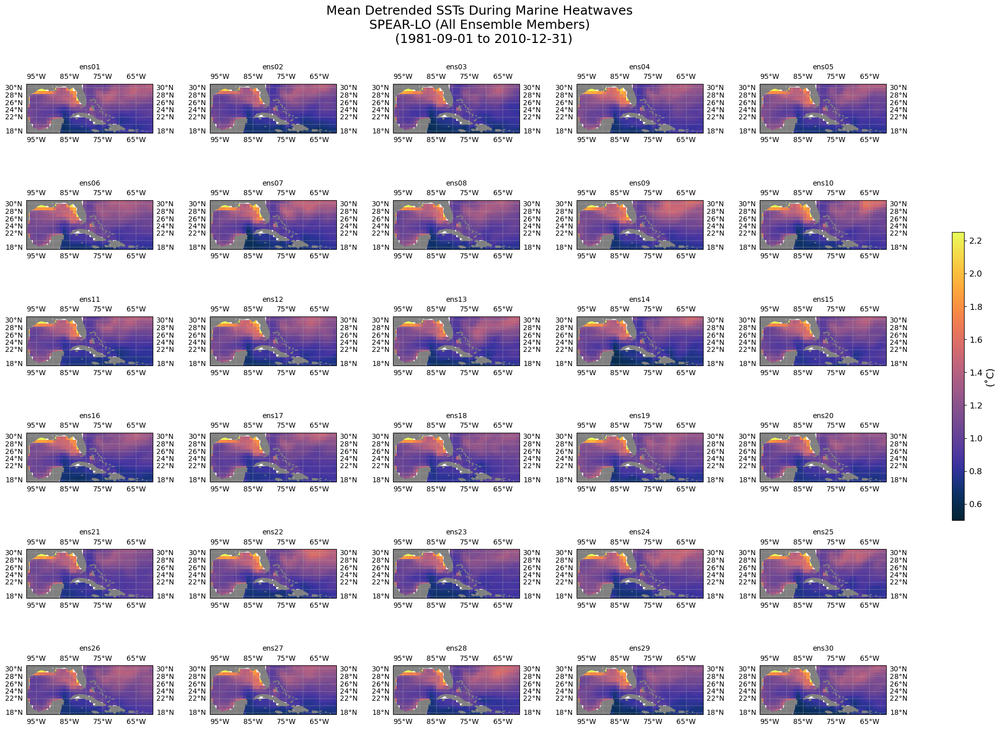

CPU times: user 43.2 s, sys: 1min 2s, total: 1min 45s
Wall time: 1min 41s


In [28]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

# ---- shared normalization (CRITICAL for colorbar) ----
# temporarily stack ensemble members into one DataArray to get min/max
stacked = xr.concat(mean_mhw_temp, dim="ensemble") #xr creates an 'ens' dim to stack da's along
vmin = stacked.min().compute().item()
vmax = stacked.max().compute().item()
norm = mcolors.Normalize(vmin=0.5, vmax=2.25)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(mean_mhw_temp[i], cmap_choice=cmocean.cm.thermal, var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('(˚C)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Mean Detrended SSTs During Marine Heatwaves \nSPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

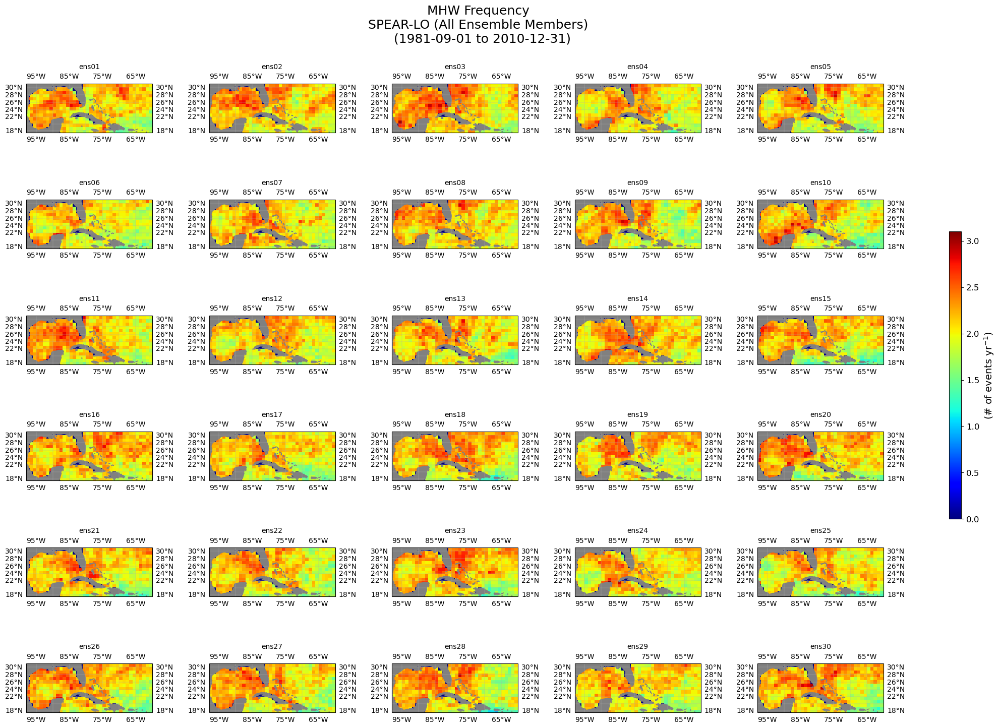

CPU times: user 39.1 s, sys: 2.26 s, total: 41.4 s
Wall time: 40.4 s


In [29]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

# ---- shared normalization (CRITICAL for colorbar) ----
# temporarily stack ensemble members into one DataArray to get min/max
stacked = xr.concat(event_freq_splo, dim="ensemble") #xr creates an 'ens' dim to stack da's along
vmin = stacked.min().compute().item()
vmax = stacked.max().compute().item()
norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(event_freq_splo[i], cmap_choice='jet', var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label(r'(# of events yr$^{-1}$)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("MHW Frequency \nSPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

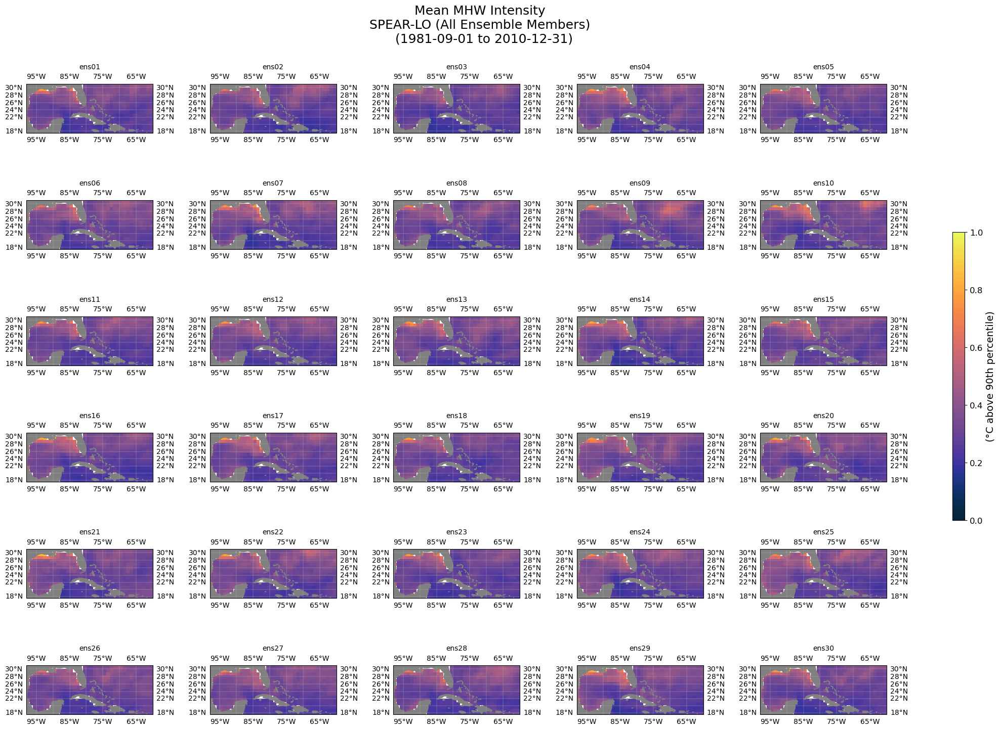

CPU times: user 27.5 s, sys: 34.5 s, total: 1min 2s
Wall time: 1min 39s


In [30]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = mcolors.Normalize(vmin=0, vmax=1)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(mhw_intensity_splo[i], cmap_choice=cmocean.cm.thermal, 
                      var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('(°C above 90th percentile)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Mean MHW Intensity \nSPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

### Extra maps

In [ ]:
fig, (ax0,ax1) = plt.subplots(1,2, figsize=(11, 3))
total_mhw_days.plot(cmap='jet', ax=ax0)
ax0.grid()
ax0.plot(269.625, 27.625, 'wo')

total_mhw_days.plot(cmap='jet', ax=ax1)
ax1.grid()
ax1.plot(276.625, 29.125, 'wo');

In [ ]:
fig, (ax0,ax1) = plt.subplots(1,2, figsize=(11, 3))
event_mask.sel(lat=27.625, lon=269.625).groupby('time.year').sum('time').plot(ax=ax0)
ax0.grid()
ax0.set_title('MHW days for every year \n in central northern dot')
event_mask.sel(lat=29.125, lon=276.625).groupby('time.year').sum('time').plot(ax=ax1)
ax1.grid()
ax1.set_title('MHW days for every year \n in eastern-northern dot');

In [ ]:
cartopy_plot(mean_duration, 'xT', 'yT', 'jet', '# of days', 
             'Avg # of MHW days\n SPEAR-LO')#,vmin=0, vmax=14,);#if time res is daily


In [ ]:
cartopy_plot(median_duration, 'xT', 'yT', 'jet', '# of days', 
             'Median # of MHW days\n SPEAR-LO');#if time res is daily


In [ ]:
cartopy_plot(max_duration, 'xT', 'yT', 'jet', '# of days', 
             'Longest MHW event (in days)\n SPEAR-LO');#if time res is daily


In [ ]:
fig, ax = plt.subplots(1,3, figsize=(15,4))
mean_duration.plot(ax=ax[0], cmap='jet')
ax[0].set_title('Avg # of days')
median_duration.plot(ax=ax[1], cmap='jet')
ax[1].set_title('Median # of days')
max_duration.plot(ax=ax[2], cmap='jet')
ax[2].set_title('Longest MHW event (in days)')
plt.tight_layout()
plt.suptitle('OISST', y=1.05);

## BIAS MAPS
- Interpolate `OISST` onto `SPEAR-LO` grid (New maps below originals in `OISST` section)
- Take difference between `OISST` and `SPEAR-LO`
------------
- Interpolate `ERA5` onto `SPEAR-LO` grid (New maps below originals in `OISST` section)
- Take difference between `ERA5` and `SPEAR-LO`

### OISST | SPEAR-LO

In [23]:
spear_lo_grid = event_counts_splo[0].rename({'yT':'lat', 'xT':'lon'})

regridder_oi = xe.Regridder(event_count_oi, spear_lo_grid, method='bilinear')
ev_ct_oi_ng = regridder_oi(event_count_oi)

regridder_oi = xe.Regridder(total_mhw_days_oi, spear_lo_grid, method='bilinear')
tot_mhw_days_oi_ng = regridder_oi(total_mhw_days_oi)

regridder_oi = xe.Regridder(mean_duration_oi, spear_lo_grid, method='bilinear')
mean_dur_oi_ng = regridder_oi(mean_duration_oi)

regridder_oi = xe.Regridder(median_duration_oi, spear_lo_grid, method='bilinear')
med_dur_oi_ng = regridder_oi(median_duration_oi)

regridder_oi = xe.Regridder(max_duration_oi, spear_lo_grid, method='bilinear')
max_dur_oi_ng = regridder_oi(max_duration_oi)

regridder_oi = xe.Regridder(mean_mhw_temp_oi, spear_lo_grid, method='bilinear')
mean_mhw_tmp_oi_ng = regridder_oi(mean_mhw_temp_oi)

regridder_oi = xe.Regridder(event_freq_oi, spear_lo_grid, method='bilinear')
ev_freq_oi_ng = regridder_oi(event_freq_oi)

regridder_oi = xe.Regridder(mhw_intensity_oi, spear_lo_grid, method='bilinear')
mhw_int_oi_ng = regridder_oi(mhw_intensity_oi)

In [24]:
mean_duration_oi

<xarray.DataArray 'duration' (lat: 84, lon: 328)> Size: 220kB
dask.array<open_dataset-duration, shape=(84, 328), dtype=float64, chunksize=(84, 328), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 672B 10.12 10.38 10.62 10.88 ... 30.38 30.62 30.88
  * lon      (lon) float64 3kB 262.1 262.4 262.6 262.9 ... 343.4 343.6 343.9

In [25]:
ev_ct_bias_oi = [da - ev_ct_oi_ng.rename({'lat':'yT', 'lon':'xT'}) for da in event_counts_splo]
tot_mhw_days_bias_oi = [da - tot_mhw_days_oi_ng.rename({'lat':'yT', 'lon':'xT'}) for da in total_mhw_days]
mean_dur_bias_oi = mean_duration - mean_dur_oi_ng.rename({'lat':'yT', 'lon':'xT'}) 
med_dur_bias_oi = median_duration - med_dur_oi_ng.rename({'lat':'yT', 'lon':'xT'})
max_dur_bias_oi = max_duration - max_dur_oi_ng.rename({'lat':'yT', 'lon':'xT'})
mean_mhw_tmp_bias_oi = [da - mean_mhw_tmp_oi_ng.rename({'lat':'yT', 'lon':'xT'}) for da in mean_mhw_temp]
ev_freq_bias_oi = [da - ev_freq_oi_ng.rename({'lat':'yT', 'lon':'xT'}) for da in event_freq_splo]
mhw_int_bias_oi = [da - mhw_int_oi_ng.rename({'lat':'yT', 'lon':'xT'}) for da in mhw_intensity_splo]

In [29]:
mhw_int_bias_oi

[<xarray.DataArray (yT: 26, xT: 83)> Size: 17kB
 dask.array<sub, shape=(26, 83), dtype=float64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     quantile  float64 8B 0.9,
 <xarray.DataArray (yT: 26, xT: 83)> Size: 17kB
 dask.array<sub, shape=(26, 83), dtype=float64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     quantile  float64 8B 0.9,
 <xarray.DataArray (yT: 26, xT: 83)> Size: 17kB
 dask.array<sub, shape=(26, 83), dtype=float64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
  

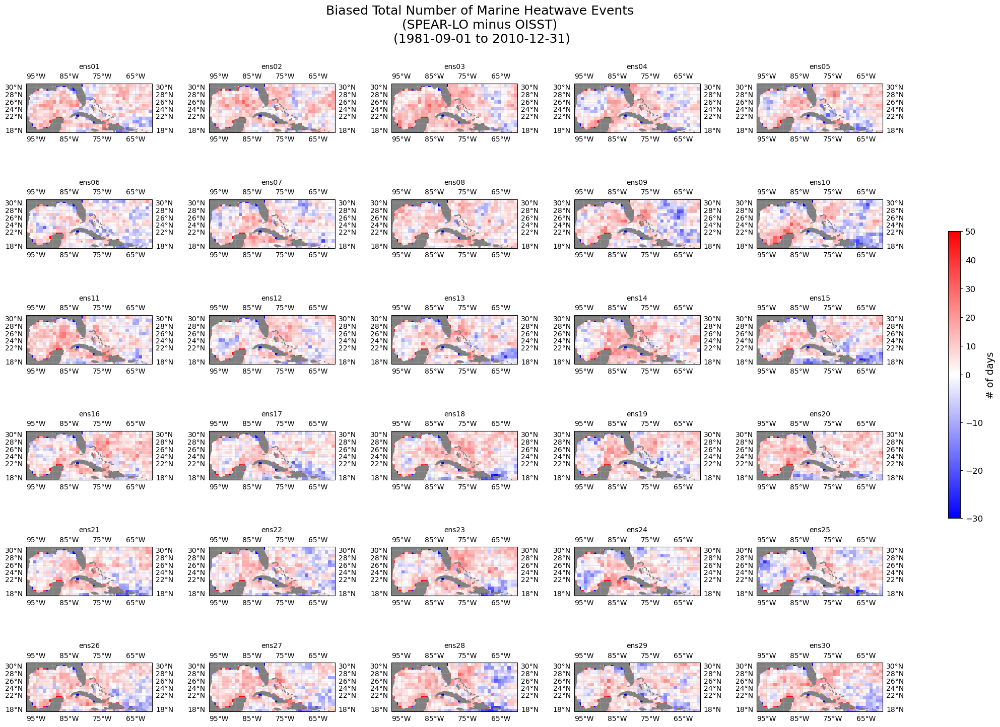

CPU times: user 26.1 s, sys: 1.67 s, total: 27.8 s
Wall time: 27 s


In [37]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-30, vcenter=0, vmax=50)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(ev_ct_bias_oi[i], cmap_choice='bwr', var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Total Number of Marine Heatwave Events\n (SPEAR-LO minus OISST) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

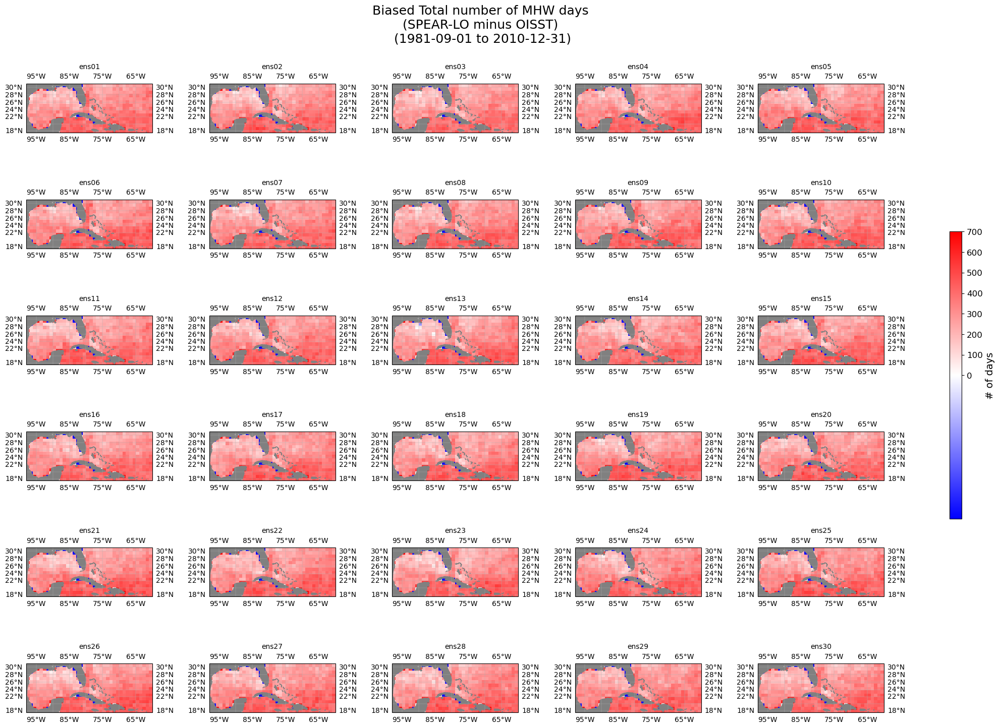

CPU times: user 14.7 s, sys: 864 ms, total: 15.6 s
Wall time: 15.6 s


In [38]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-10, vcenter=0, vmax=700)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(tot_mhw_days_bias_oi[i], cmap_choice='bwr', var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Total number of MHW days\n (SPEAR-LO minus OISST) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

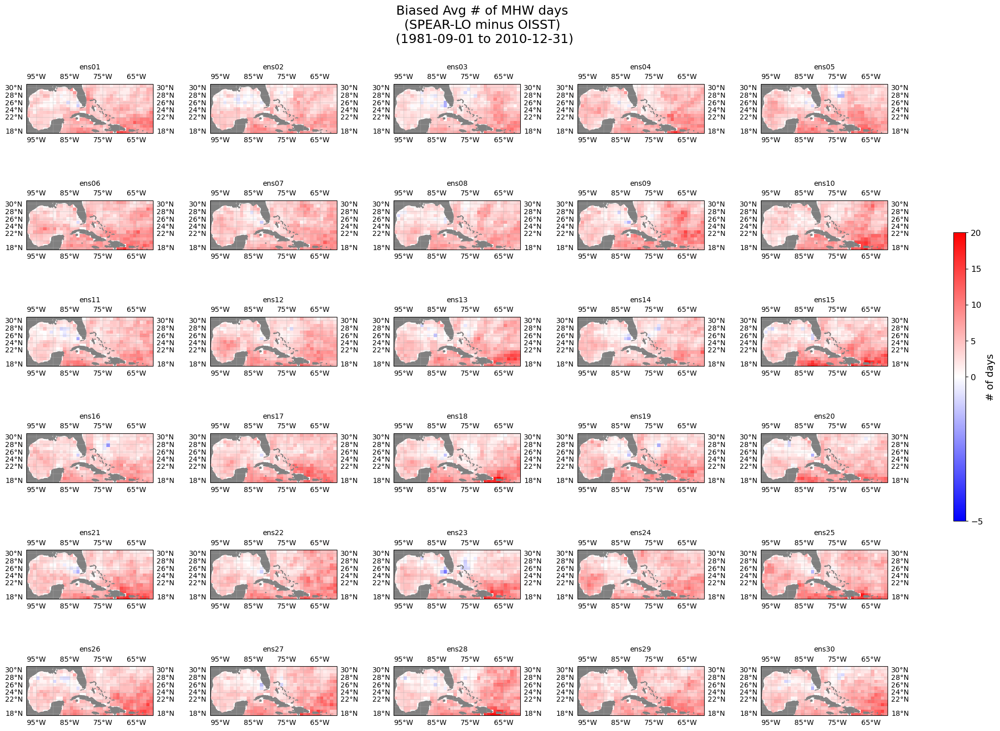

CPU times: user 11.8 s, sys: 68.7 ms, total: 11.8 s
Wall time: 11.9 s


In [61]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-5, vcenter=0, vmax=20)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(mean_dur_bias_oi.isel(ensemble=i), cmap_choice='bwr', var_title=title, 
                      norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Avg # of MHW days\n (SPEAR-LO minus OISST) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

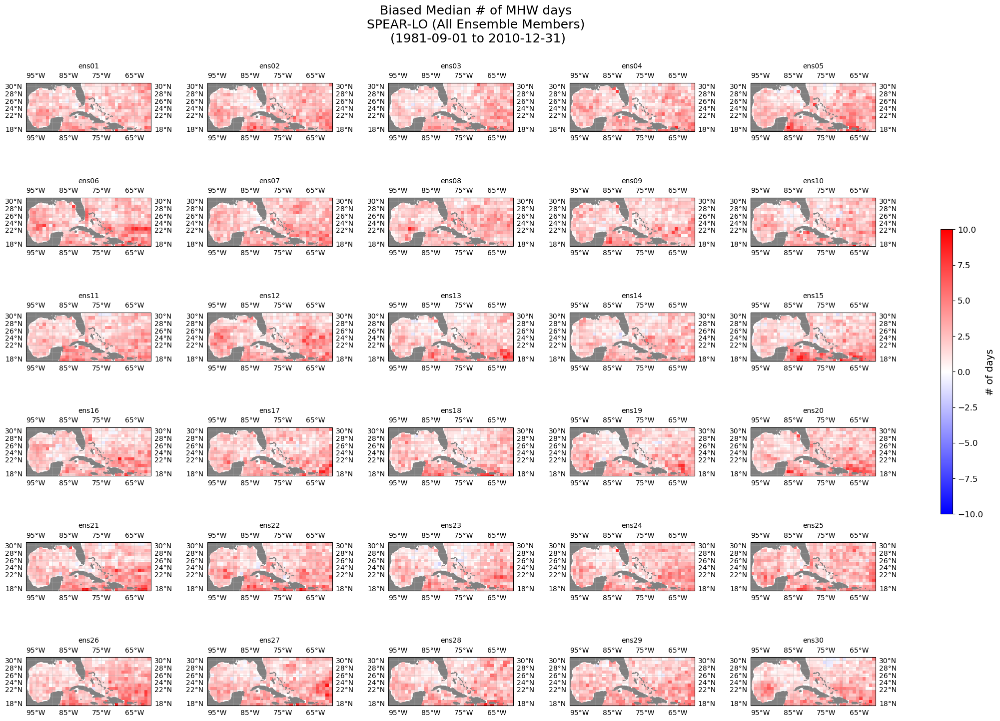

CPU times: user 11.8 s, sys: 56.6 ms, total: 11.9 s
Wall time: 11.9 s


In [69]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-10, vcenter=0, vmax=10)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(med_dur_bias_oi.isel(ensemble=i), cmap_choice='bwr', var_title=title, 
                      norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Median # of MHW days\n SPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

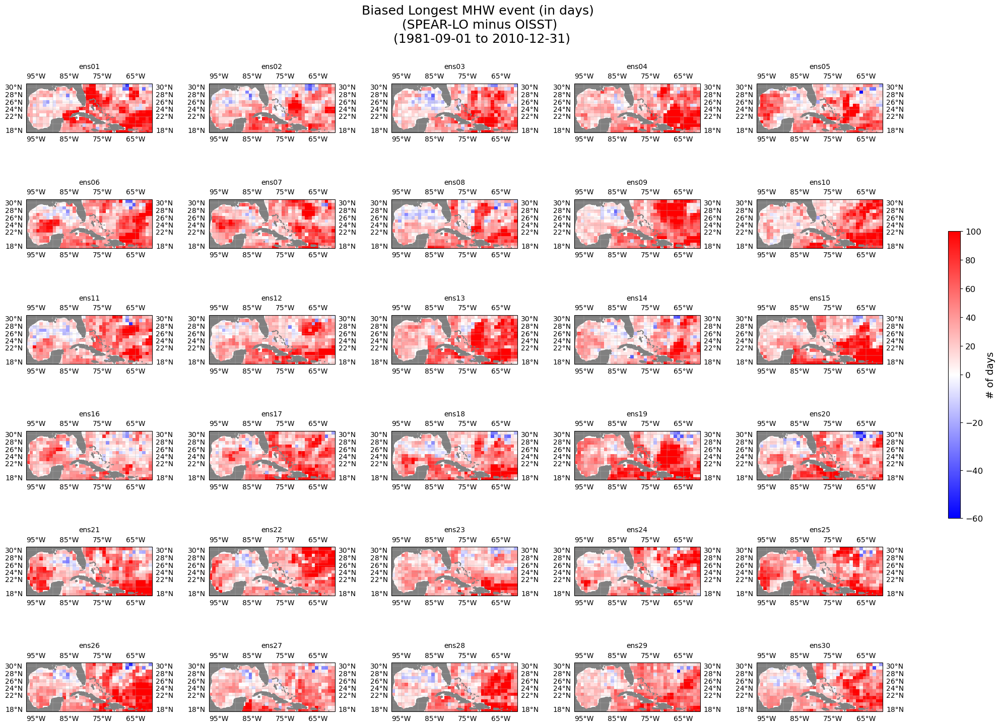

CPU times: user 11.9 s, sys: 50.2 ms, total: 12 s
Wall time: 12 s


In [71]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-60, vcenter=0, vmax=100)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(max_dur_bias_oi.isel(ensemble=i), cmap_choice='bwr', var_title=title, 
                      norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Longest MHW event (in days) \n (SPEAR-LO minus OISST) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

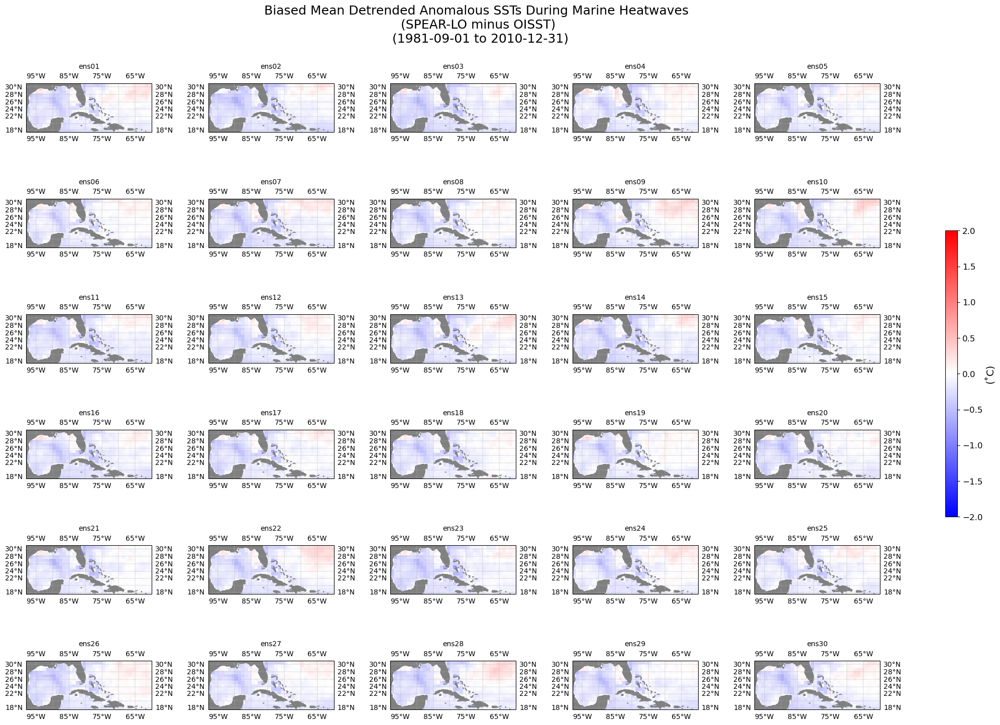

CPU times: user 24.8 s, sys: 20.2 s, total: 45 s
Wall time: 45 s


In [68]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-2, vcenter=0, vmax=2)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(mean_mhw_tmp_bias_oi[i], cmap_choice='bwr', var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('(˚C)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Mean Detrended Anomalous SSTs During Marine Heatwaves \n (SPEAR-LO minus OISST) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

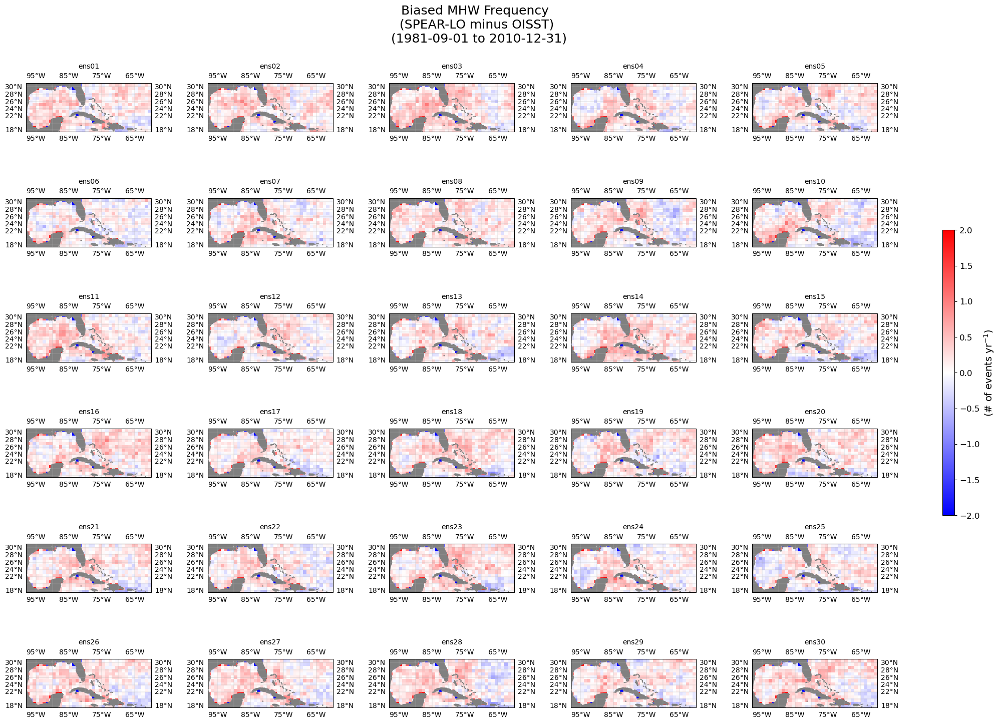

CPU times: user 26.4 s, sys: 1.74 s, total: 28.1 s
Wall time: 27.4 s


In [65]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-2, vcenter=0, vmax=2)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(ev_freq_bias_oi[i], cmap_choice='bwr', var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label(r'(# of events yr$^{-1}$)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased MHW Frequency \n (SPEAR-LO minus OISST) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

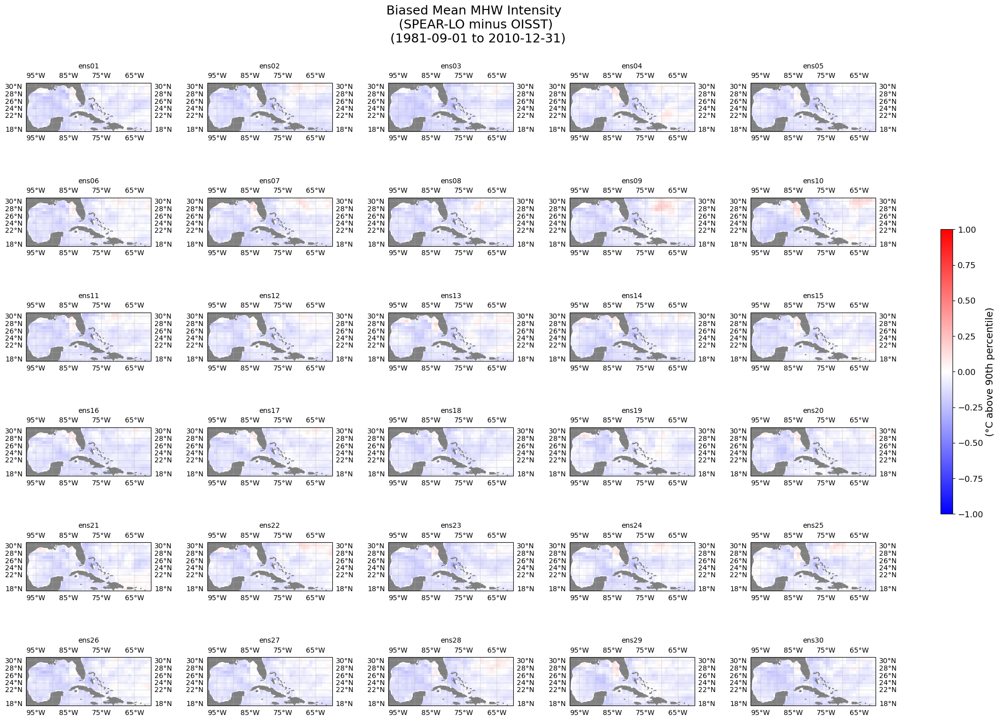

CPU times: user 26.5 s, sys: 30.7 s, total: 57.3 s
Wall time: 57.3 s


In [66]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = mcolors.Normalize(vmin=-1, vmax=1)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(mhw_int_bias_oi[i], cmap_choice='bwr', 
                      var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('(°C above 90th percentile)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Mean MHW Intensity \n (SPEAR-LO minus OISST) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

### ERA5 | SPEAR-LO

In [27]:
spear_lo_grid = event_counts_splo[0].rename({'yT':'latitude', 'xT':'longitude'})

regridder_era = xe.Regridder(event_count_era, spear_lo_grid, method='bilinear')
ev_ct_era_ng = regridder_era(event_count_era)

regridder_era = xe.Regridder(total_mhw_days_era, spear_lo_grid, method='bilinear')
tot_mhw_days_era_ng = regridder_era(total_mhw_days_era)

regridder_era = xe.Regridder(mean_duration_era, spear_lo_grid, method='bilinear')
mean_dur_era_ng = regridder_era(mean_duration_era)

regridder_era = xe.Regridder(median_duration_era, spear_lo_grid, method='bilinear')
med_dur_era_ng = regridder_era(median_duration_era)

regridder_era = xe.Regridder(max_duration_era, spear_lo_grid, method='bilinear')
max_dur_era_ng = regridder_era(max_duration_era)

regridder_era = xe.Regridder(mean_mhw_temp_era, spear_lo_grid, method='bilinear')
mean_mhw_tmp_era_ng = regridder_era(mean_mhw_temp_era)

regridder_era = xe.Regridder(event_freq_era, spear_lo_grid, method='bilinear')
ev_freq_era_ng = regridder_era(event_freq_era)

regridder_era = xe.Regridder(mhw_intensity_era, spear_lo_grid, method='bilinear')
mhw_int_era_ng = regridder_era(mhw_intensity_era)

In [28]:
ev_ct_bias_era = [da - ev_ct_era_ng.rename({'latitude':'yT', 'longitude':'xT'}) for da in event_counts_splo]
tot_mhw_days_bias_era = [da - tot_mhw_days_era_ng.rename({'latitude':'yT', 'longitude':'xT'}) for da in total_mhw_days]
mean_dur_bias_era = mean_duration - mean_dur_era_ng.rename({'latitude':'yT', 'longitude':'xT'}) 
med_dur_bias_era = median_duration - med_dur_era_ng.rename({'latitude':'yT', 'longitude':'xT'})
max_dur_bias_era = max_duration - max_dur_era_ng.rename({'latitude':'yT', 'longitude':'xT'})
mean_mhw_tmp_bias_era = [da - mean_mhw_tmp_era_ng.rename({'latitude':'yT', 'longitude':'xT'}) for da in mean_mhw_temp]
ev_freq_bias_era = [da - ev_freq_era_ng.rename({'latitude':'yT', 'longitude':'xT'}) for da in event_freq_splo]
mhw_int_bias_era = [da - mhw_int_era_ng.rename({'latitude':'yT', 'longitude':'xT'}) for da in mhw_intensity_splo]

In [74]:
mhw_int_bias_era

[<xarray.DataArray (yT: 26, xT: 83)> Size: 17kB
 dask.array<sub, shape=(26, 83), dtype=float64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     quantile  float64 8B 0.9,
 <xarray.DataArray (yT: 26, xT: 83)> Size: 17kB
 dask.array<sub, shape=(26, 83), dtype=float64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     quantile  float64 8B 0.9,
 <xarray.DataArray (yT: 26, xT: 83)> Size: 17kB
 dask.array<sub, shape=(26, 83), dtype=float64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
  

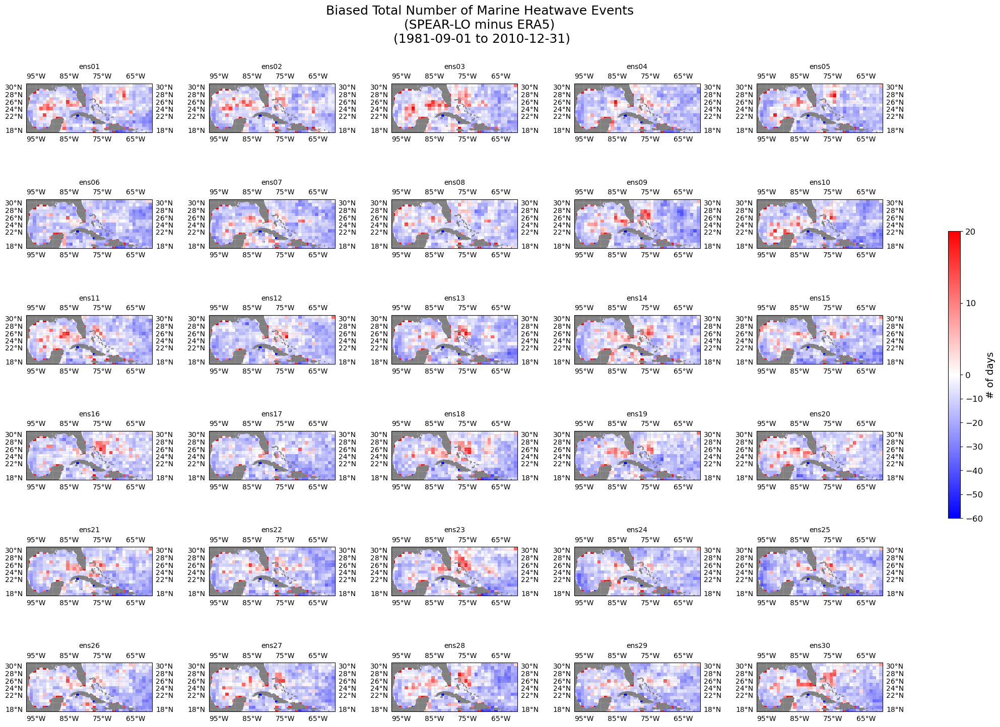

CPU times: user 25 s, sys: 1.62 s, total: 26.6 s
Wall time: 25.9 s


In [84]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-60, vcenter=0, vmax=20)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(ev_ct_bias_era[i], cmap_choice='bwr', var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Total Number of Marine Heatwave Events\n (SPEAR-LO minus ERA5) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

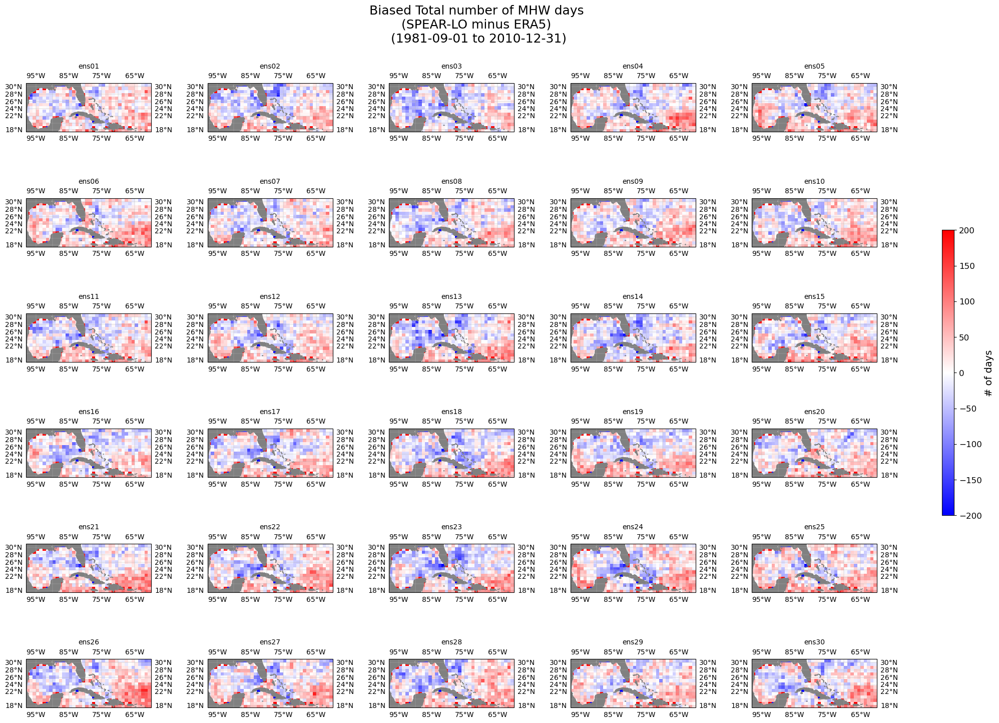

CPU times: user 13 s, sys: 801 ms, total: 13.8 s
Wall time: 13.7 s


In [87]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-200, vcenter=0, vmax=200)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(tot_mhw_days_bias_era[i], cmap_choice='bwr', var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Total number of MHW days\n (SPEAR-LO minus ERA5) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

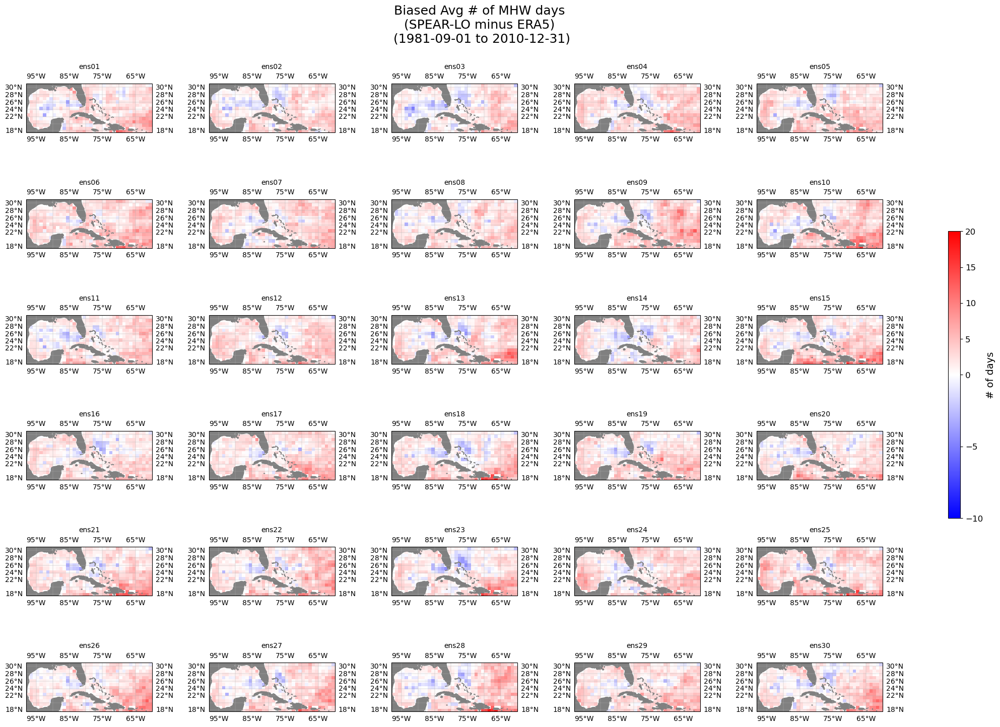

CPU times: user 11.9 s, sys: 40.2 ms, total: 12 s
Wall time: 12 s


In [85]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-10, vcenter=0, vmax=20)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(mean_dur_bias_era.isel(ensemble=i), cmap_choice='bwr', var_title=title, 
                      norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Avg # of MHW days\n (SPEAR-LO minus ERA5) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

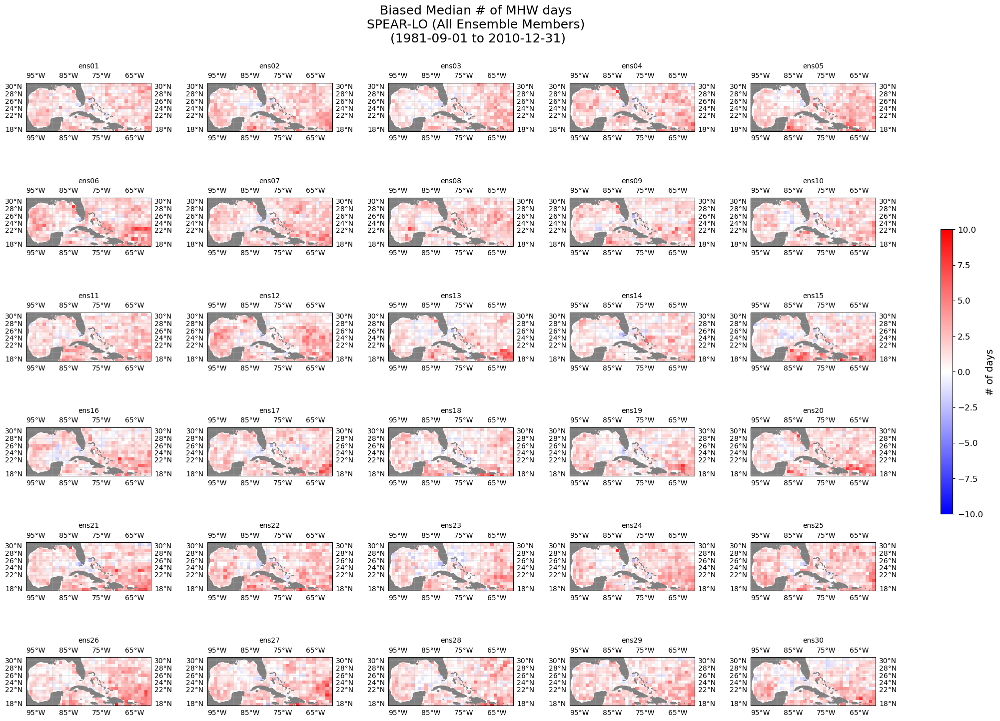

CPU times: user 11.9 s, sys: 42.8 ms, total: 11.9 s
Wall time: 11.9 s


In [78]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-10, vcenter=0, vmax=10)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(med_dur_bias_era.isel(ensemble=i), cmap_choice='bwr', var_title=title, 
                      norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Median # of MHW days\n SPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

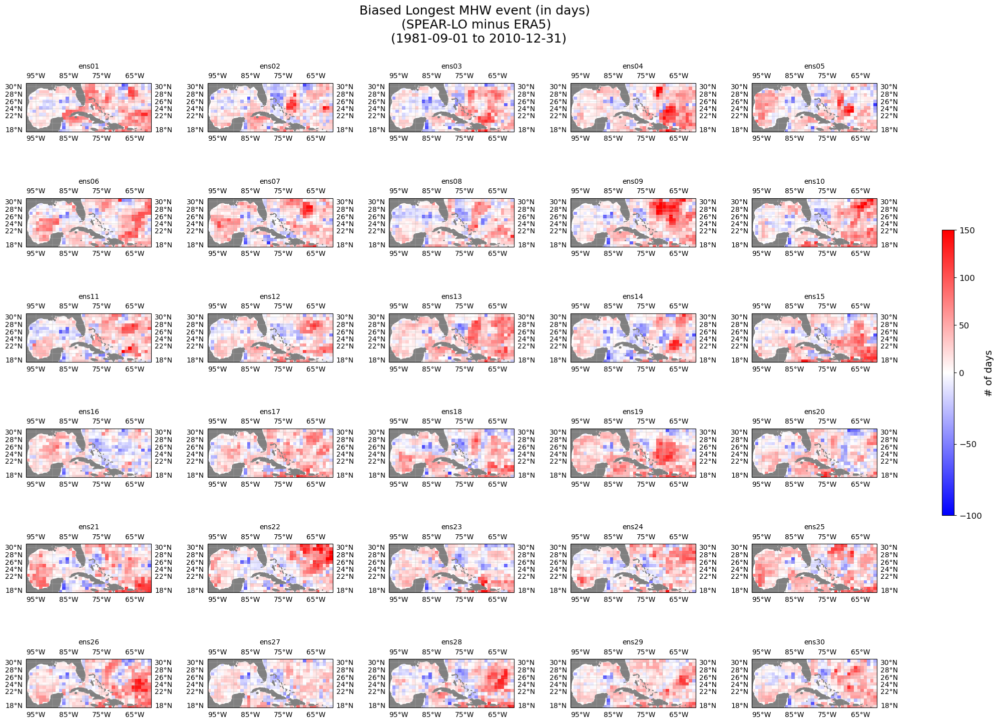

CPU times: user 11.9 s, sys: 50.6 ms, total: 11.9 s
Wall time: 12 s


In [86]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-100, vcenter=0, vmax=150)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(max_dur_bias_era.isel(ensemble=i), cmap_choice='bwr', var_title=title, 
                      norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Longest MHW event (in days) \n (SPEAR-LO minus ERA5) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

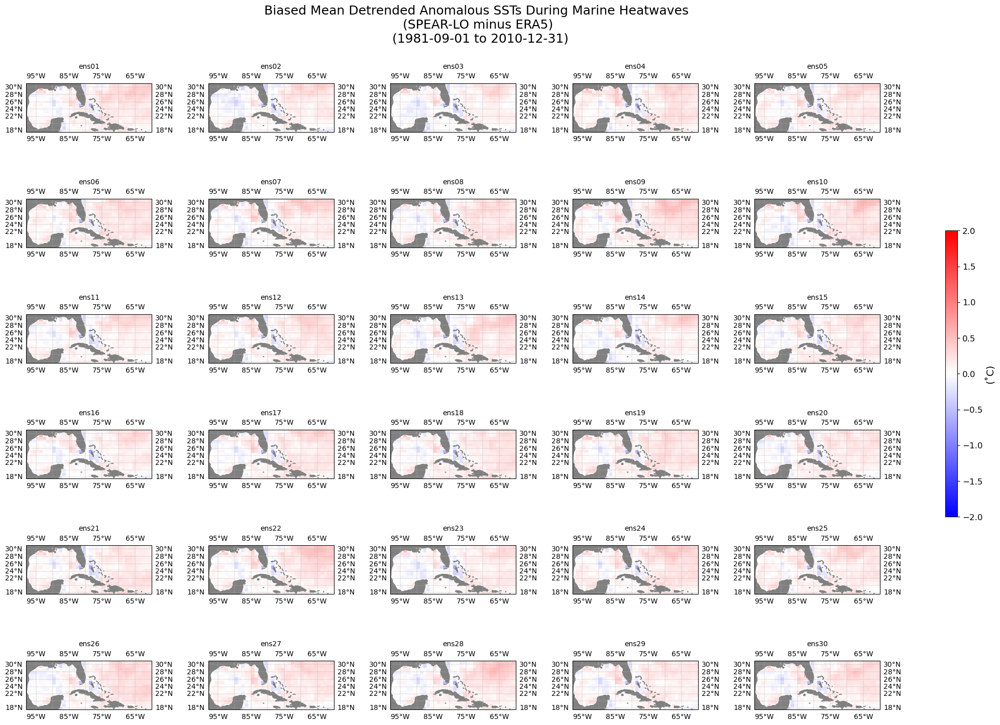

CPU times: user 24.8 s, sys: 20.3 s, total: 45.1 s
Wall time: 45.1 s


In [80]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-2, vcenter=0, vmax=2)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(mean_mhw_tmp_bias_era[i], cmap_choice='bwr', var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('(˚C)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Mean Detrended Anomalous SSTs During Marine Heatwaves \n (SPEAR-LO minus ERA5) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

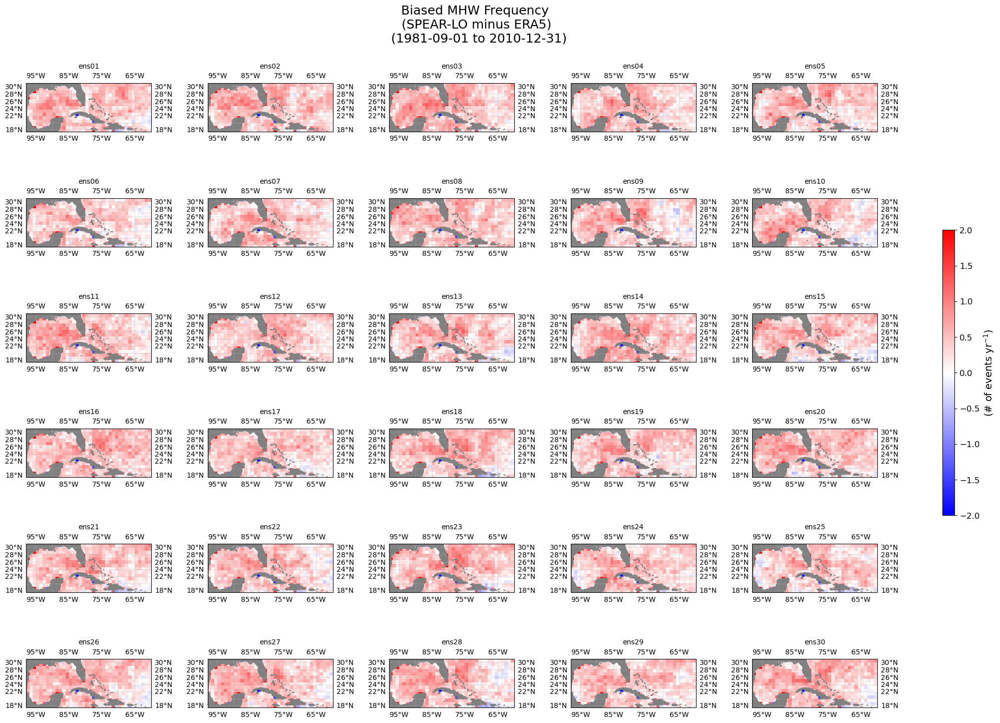

CPU times: user 25 s, sys: 1.59 s, total: 26.6 s
Wall time: 25.8 s


In [81]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-2, vcenter=0, vmax=2)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(ev_freq_bias_era[i], cmap_choice='bwr', var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label(r'(# of events yr$^{-1}$)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased MHW Frequency \n (SPEAR-LO minus ERA5) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

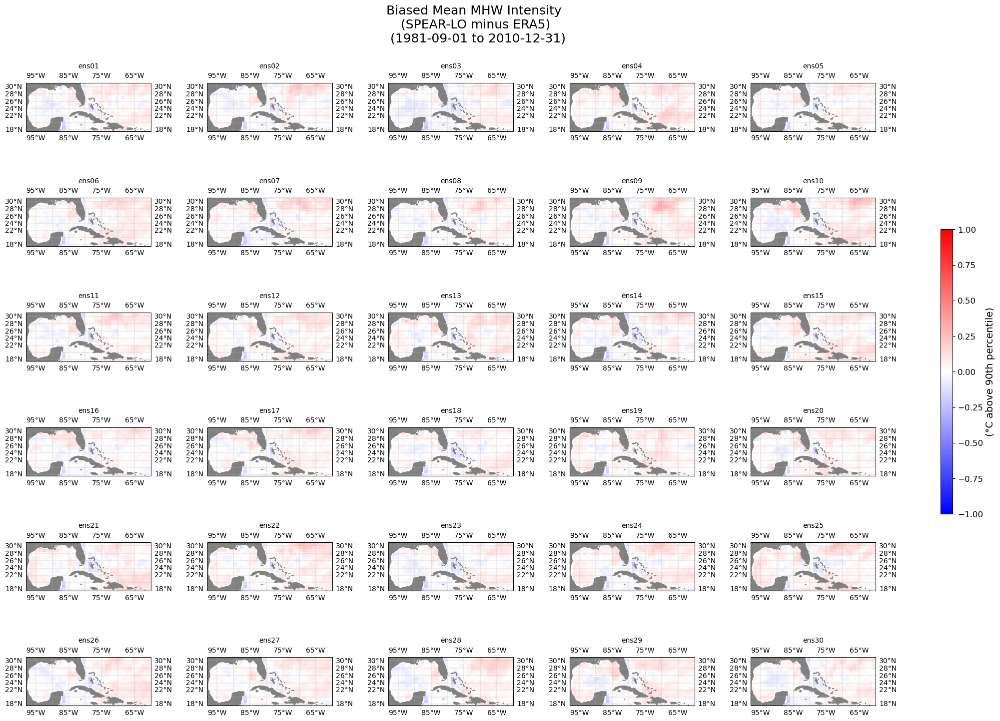

CPU times: user 26.7 s, sys: 30.6 s, total: 57.3 s
Wall time: 57.3 s


In [82]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = mcolors.Normalize(vmin=-1, vmax=1)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(mhw_int_bias_era[i], cmap_choice='bwr', 
                      var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('(°C above 90th percentile)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Mean MHW Intensity \n (SPEAR-LO minus ERA5) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

## BIAS MAPS (Ensemble mean)

In [ ]:
#How far is the ensemble-mean model from observations, in units of observed variability?:
sigma_O = mhw_int_oi_ng.std('time') # Observed interannual variability of the MHW metric

z = (mhw_spear_ensmean - mhw_intensity_oi) / sigma_O
#Is the bias robust across ensemble members?:
z_member = (mhw_intensity_spear - mhw_intensity_oi) / sigma_O
z_mean = z_member.mean('ensemble')
z_spread = z_member.std('ensemble')
#Make sure sigma(O) is not zero in low variance regions: sigma_O = sigma_O.where(sigma_O > 1e-3)

In [ ]:
squared_sums <- sum((obs - pred)^2)
    mse <- squared_sums/length(obs)
    rmse <- sqrt(mse)

Overall Q: **How different is the model’s representation of MHW statistics relative to observed variability?**
> How far is the ensemble-mean model from observations, in units of observed interannual variability? Use z-score:
$$z = \frac{(\text{ens-mean} - \text{obs})} {\sigma_{obs}}$$
> - |z| = < 0.5 $\rightarrow$ small difference
> - |z| = $\simeq$ model differs by one observed std ($\sigma_{obs}$)
> - |z| = > 2 $\rightarrow$ large, physically meaningful discrepancy
> What is the overall agreement between ensemble mean and obs, and what is the spatial skill of the model?
$$ \text{nRMSE} = \sqrt{}$$

In [33]:
ev_freq_oi_ng

<xarray.DataArray (lat: 26, lon: 83)> Size: 17kB
dask.array<sum-aggregate, shape=(26, 83), dtype=float64, chunksize=(26, 83), chunktype=numpy.ndarray>
Coordinates:
    time     datetime64[ns] 8B ...
  * lon      (lon) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
  * lat      (lat) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
Attributes:
    regrid_method:  bilinear

In [32]:
mhw_int_oi_ng

<xarray.DataArray (lat: 26, lon: 83)> Size: 17kB
dask.array<sum-aggregate, shape=(26, 83), dtype=float64, chunksize=(26, 83), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
  * lat      (lat) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
Attributes:
    regrid_method:  bilinear

In [34]:
med_dur_oi_ng

<xarray.DataArray (lat: 26, lon: 83)> Size: 17kB
dask.array<sum-aggregate, shape=(26, 83), dtype=float64, chunksize=(26, 83), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
  * lat      (lat) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
Attributes:
    regrid_method:  bilinear

In [31]:
#Z-score 
#Mean Intensity
stacked_mhw_int = xr.concat(mhw_intensity_splo, dim="ensemble")
mhw_int_ens_mean = stacked_mhw_int.mean('ensemble')
sigma_int_oi = mhw_int_oi_ng.rename({'lat':'yT', 'lon':'xT'}).std('time')
mhw_int_bias_ens_mean_oi = ((mhw_int_ens_mean - mhw_int_oi_ng.rename({'lat':'yT', 'lon':'xT'}))
                            / sigma_int_oi)
sigma_int_era = mhw_int_era_ng.rename({'latitude':'yT', 'longitude':'xT'}).std('time')
mhw_int_bias_ens_mean_era = ((mhw_int_ens_mean - mhw_int_era_ng.rename({'latitude':'yT', 'longitude':'xT'}))
                              / sigma_int_era)

#Mean Frequency
stacked_ev_freq = xr.concat(event_freq_splo, dim="ensemble")
ev_freq_ens_mean = stacked_ev_freq.mean('ensemble')
sigma_freq_oi = ev_freq_oi_ng.rename({'lat':'yT', 'lon':'xT'}).std('time')
ev_freq_bias_ens_mean_oi = ((ev_freq_ens_mean - ev_freq_oi_ng.rename({'lat':'yT', 'lon':'xT'}))
                             / sigma_freq_oi)
sigma_freq_era = ev_freq_era_ng.rename({'latitude':'yT', 'longitude':'xT'}).std('time')
ev_freq_bias_ens_mean_era = ((ev_freq_ens_mean - ev_freq_era_ng.rename({'latitude':'yT', 'longitude':'xT'}))
                              / sigma_freq_era)

#Median Duration
sigma_med_dur_oi = med_dur_oi_ng.rename({'lat':'yT', 'lon':'xT'}).std('time')
med_dur_bias_ens_mean_oi = ((median_duration.mean('ensemble') - med_dur_oi_ng.rename({'lat':'yT', 'lon':'xT'})) 
                            / sigma_med_dur_oi) 
sigma_med_dur_era = med_dur_era_ng.rename({'latitude':'yT', 'longitude':'xT'}).std('time')
med_dur_bias_ens_mean_era = ((median_duration.mean('ensemble') - med_dur_era_ng.rename({'latitude':'yT',
                                                                                        'longitude':'xT'})) 
                             / sigma_med_dur_era)

ValueError: 'time' not found in array dimensions ('yT', 'xT')

In [ ]:
# nRMSE
sq_error = (ev_ct_ens_mean - ev_ct_oi_ng.rename({'lat':'yT', 'lon':'xT'})) ** 2
rmse = (sq_error.mean('time')) ** 0.5
nrmse = rmse / sigma_oi

In [ ]:
#Ensemble mean
stacked_ev_ct = xr.concat(event_counts_splo, dim="ensemble")
ev_ct_ens_mean = stacked_ev_ct.mean('ensemble')
ev_ct_bias_ens_mean_oi = ev_ct_ens_mean - ev_ct_oi_ng.rename({'lat':'yT', 'lon':'xT'})
ev_ct_bias_ens_mean_era = ev_ct_ens_mean - ev_ct_era_ng.rename({'latitude':'yT', 'longitude':'xT'})

stacked_tot_mhw_days = xr.concat(total_mhw_days, dim="ensemble")
tot_mhw_days_ens_mean = stacked_tot_mhw_days.mean('ensemble')
tot_mhw_days_bias_ens_mean_oi = tot_mhw_days_ens_mean - tot_mhw_days_oi_ng.rename({'lat':'yT', 'lon':'xT'})
tot_mhw_days_bias_ens_mean_era = tot_mhw_days_ens_mean - tot_mhw_days_era_ng.rename({'latitude':'yT', 
                                                                                     'longitude':'xT'})

mean_dur_bias_ens_mean_oi = mean_duration.mean('ensemble') - mean_dur_oi_ng.rename({'lat':'yT', 'lon':'xT'}) 
med_dur_bias_ens_mean_oi = median_duration.mean('ensemble') - med_dur_oi_ng.rename({'lat':'yT', 'lon':'xT'})
max_dur_bias_ens_mean_oi = max_duration.mean('ensemble') - max_dur_oi_ng.rename({'lat':'yT', 'lon':'xT'})
mean_dur_bias_ens_mean_era = mean_duration.mean('ensemble') - mean_dur_era_ng.rename({'latitude':'yT', 
                                                                                      'longitude':'xT'}) 
med_dur_bias_ens_mean_era = median_duration.mean('ensemble') - med_dur_era_ng.rename({'latitude':'yT', 
                                                                                      'longitude':'xT'})
max_dur_bias_ens_mean_era = max_duration.mean('ensemble') - max_dur_era_ng.rename({'latitude':'yT', 
                                                                                   'longitude':'xT'})

stacked_mean_mhw_temp = xr.concat(mean_mhw_temp, dim="ensemble")
mhw_temp_ens_mean = stacked_mean_mhw_temp.mean('ensemble')
mean_mhw_tmp_bias_ens_mean_oi = mhw_temp_ens_mean - mean_mhw_tmp_oi_ng.rename({'lat':'yT', 'lon':'xT'})
mean_mhw_tmp_bias_ens_mean_era = mhw_temp_ens_mean - mean_mhw_tmp_era_ng.rename({'latitude':'yT', 
                                                                                 'longitude':'xT'})

stacked_ev_freq = xr.concat(event_freq_splo, dim="ensemble")
ev_freq_ens_mean = stacked_ev_freq.mean('ensemble')
ev_freq_bias_ens_mean_oi = ev_freq_ens_mean - ev_freq_oi_ng.rename({'lat':'yT', 'lon':'xT'})
ev_freq_bias_ens_mean_era = ev_freq_ens_mean - ev_freq_era_ng.rename({'latitude':'yT', 'longitude':'xT'})

stacked_mhw_int = xr.concat(mhw_intensity_splo, dim="ensemble")
mhw_int_ens_mean = stacked_mhw_int.mean('ensemble')
mhw_int_bias_ens_mean_oi = mhw_int_ens_mean - mhw_int_oi_ng.rename({'lat':'yT', 'lon':'xT'})
mhw_int_bias_ens_mean_era = mhw_int_ens_mean - mhw_int_era_ng.rename({'latitude':'yT', 'longitude':'xT'})

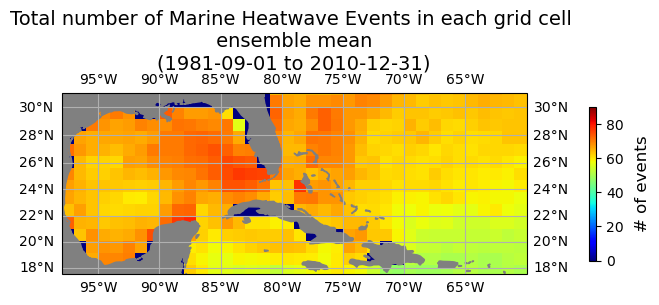

In [90]:
cartopy_plot_single(ev_ct_ens_mean, 'jet', '# of events', 
    'Total number of Marine Heatwave Events in each grid cell \n ensemble mean \n(1981-09-01 to 2010-12-31)',
                   vmin=0, vmax=90)

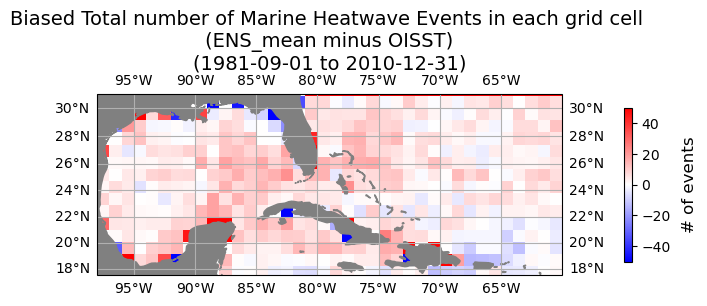

In [92]:
cartopy_plot_single(ev_ct_bias_ens_mean_oi, 'bwr', '# of events', 
    'Biased Total number of Marine Heatwave Events in each grid cell \n (ENS_mean minus OISST) \n(1981-09-01 to 2010-12-31)',
                   norm=mcolors.TwoSlopeNorm(vmin=-50, vcenter=0, vmax=50))

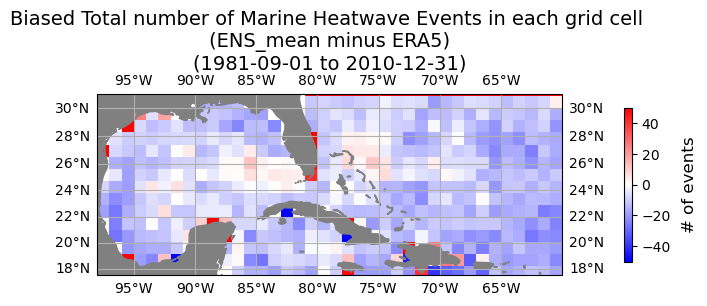

In [93]:
cartopy_plot_single(ev_ct_bias_ens_mean_era, 'bwr', '# of events', 
    'Biased Total number of Marine Heatwave Events in each grid cell \n (ENS_mean minus ERA5) \n(1981-09-01 to 2010-12-31)',
                   norm=mcolors.TwoSlopeNorm(vmin=-50, vcenter=0, vmax=50))

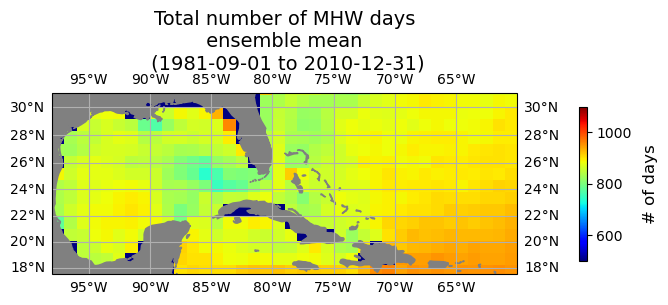

In [94]:
cartopy_plot_single(tot_mhw_days_ens_mean, 'jet', '# of days', 
'Total number of MHW days\n ensemble mean \n (1981-09-01 to 2010-12-31)',
                   vmin=500, vmax=1100)


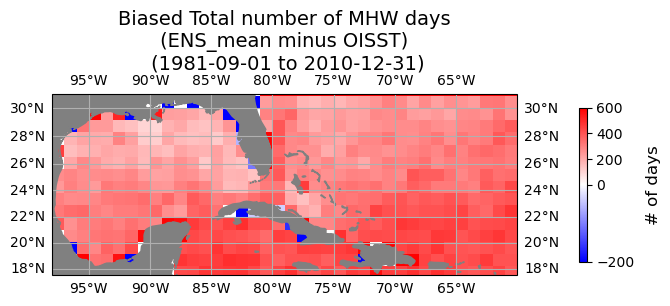

In [96]:
cartopy_plot_single(tot_mhw_days_bias_ens_mean_oi, 'bwr', '# of days', 
'Biased Total number of MHW days\n (ENS_mean minus OISST) \n (1981-09-01 to 2010-12-31)',
                   norm=mcolors.TwoSlopeNorm(vmin=-200, vcenter=0, vmax=600));

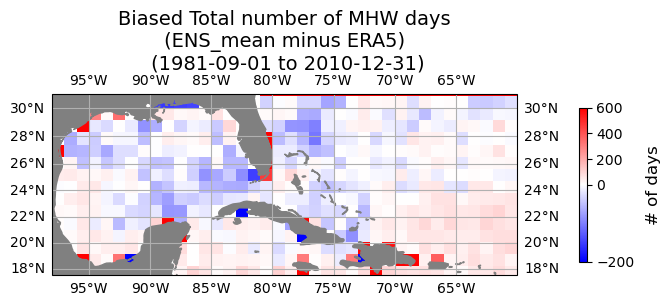

In [97]:
cartopy_plot_single(tot_mhw_days_bias_ens_mean_era, 'bwr', '# of days', 
'Biased Total number of MHW days\n (ENS_mean minus ERA5) \n (1981-09-01 to 2010-12-31)',
                   norm=mcolors.TwoSlopeNorm(vmin=-200, vcenter=0, vmax=600));

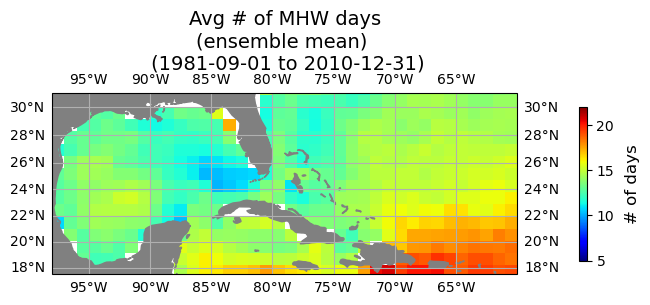

In [98]:
cartopy_plot_single(mean_duration.mean('ensemble'), 'jet', '# of days', 
    'Avg # of MHW days\n(ensemble mean) \n (1981-09-01 to 2010-12-31)',
                    vmin=5, vmax=22)


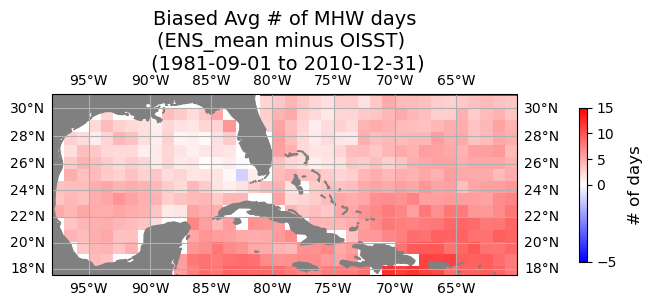

In [104]:
cartopy_plot_single(mean_dur_bias_ens_mean_oi, 'bwr', '# of days', 
    'Biased Avg # of MHW days\n(ENS_mean minus OISST) \n (1981-09-01 to 2010-12-31)',
                    norm=mcolors.TwoSlopeNorm(vmin=-5, vcenter=0, vmax=15));


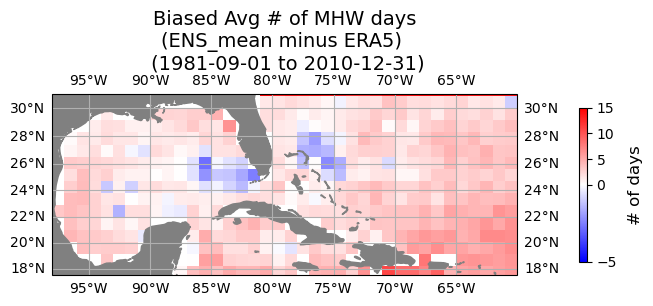

In [103]:
cartopy_plot_single(mean_dur_bias_ens_mean_era, 'bwr', '# of days', 
    'Biased Avg # of MHW days\n(ENS_mean minus ERA5) \n (1981-09-01 to 2010-12-31)',
                    norm=mcolors.TwoSlopeNorm(vmin=-5, vcenter=0, vmax=15));


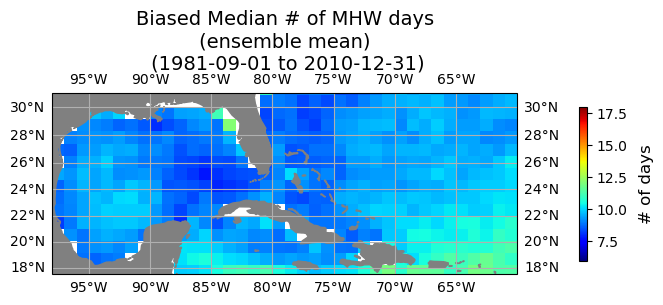

In [105]:
cartopy_plot_single(median_duration.mean('ensemble'), 'jet', '# of days', 
             'Biased Median # of MHW days\n (ensemble mean) \n (1981-09-01 to 2010-12-31)',
                    vmin=6, vmax=18);


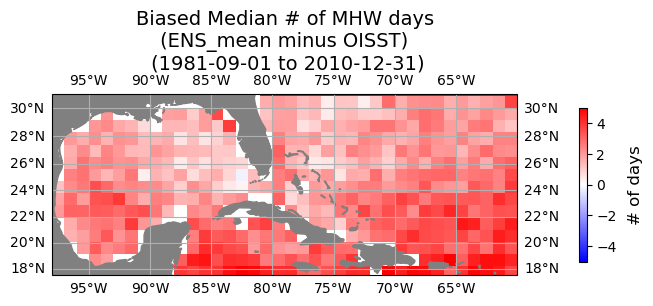

In [109]:
cartopy_plot_single(med_dur_bias_ens_mean_oi, 'bwr', '# of days', 
             'Biased Median # of MHW days\n (ENS_mean minus OISST) \n (1981-09-01 to 2010-12-31)',
                    norm=mcolors.TwoSlopeNorm(vmin=-5, vcenter=0, vmax=5));


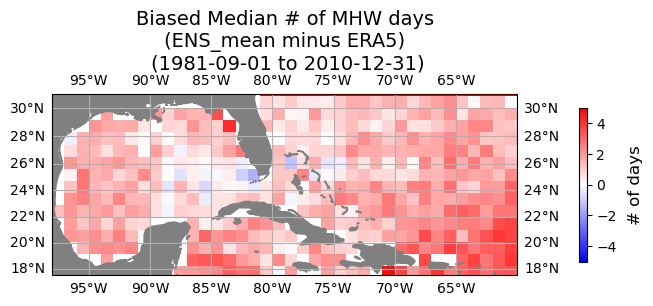

In [110]:
cartopy_plot_single(med_dur_bias_ens_mean_era, 'bwr', '# of days', 
             'Biased Median # of MHW days\n (ENS_mean minus ERA5) \n (1981-09-01 to 2010-12-31)',
                    norm=mcolors.TwoSlopeNorm(vmin=-5, vcenter=0, vmax=5));


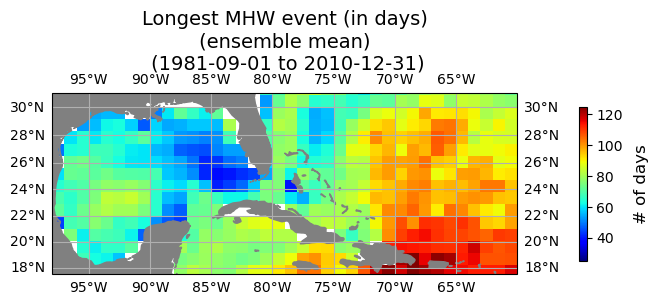

In [113]:
cartopy_plot_single(max_duration.mean('ensemble'), 'jet', '# of days', 
             'Longest MHW event (in days)\n (ensemble mean) \n (1981-09-01 to 2010-12-31)',
                    vmin=25, vmax=125);


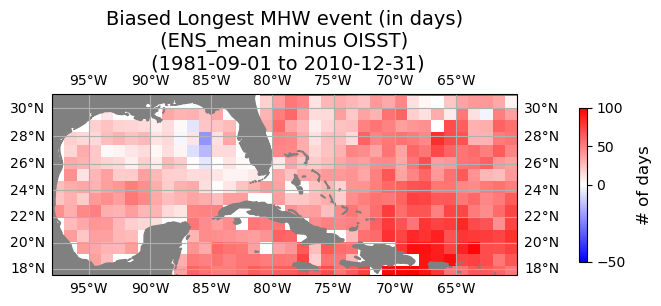

In [116]:
cartopy_plot_single(max_dur_bias_ens_mean_oi, 'bwr', '# of days', 
             'Biased Longest MHW event (in days)\n (ENS_mean minus OISST) \n (1981-09-01 to 2010-12-31)',
                    norm=mcolors.TwoSlopeNorm(vmin=-50, vcenter=0, vmax=100));


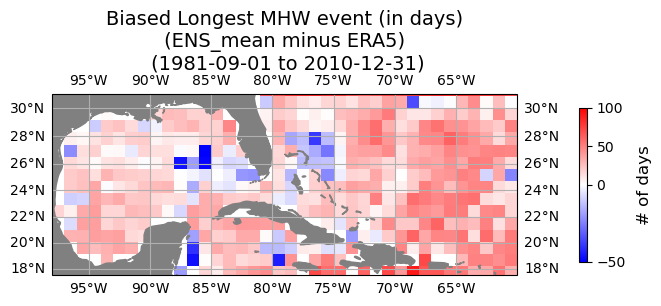

In [117]:
cartopy_plot_single(max_dur_bias_ens_mean_era, 'bwr', '# of days', 
             'Biased Longest MHW event (in days)\n (ENS_mean minus ERA5) \n (1981-09-01 to 2010-12-31)',
                    norm=mcolors.TwoSlopeNorm(vmin=-50, vcenter=0, vmax=100));


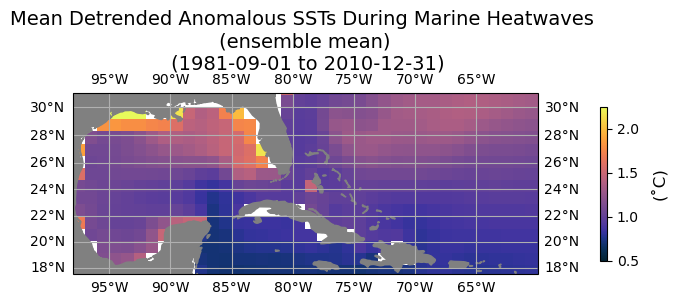

In [119]:
cartopy_plot_single(mhw_temp_ens_mean, cmocean.cm.thermal, '(˚C)', 
'Mean Detrended Anomalous SSTs During Marine Heatwaves \n (ensemble mean) \n (1981-09-01 to 2010-12-31)',
                    vmin=0.5, vmax=2.25)

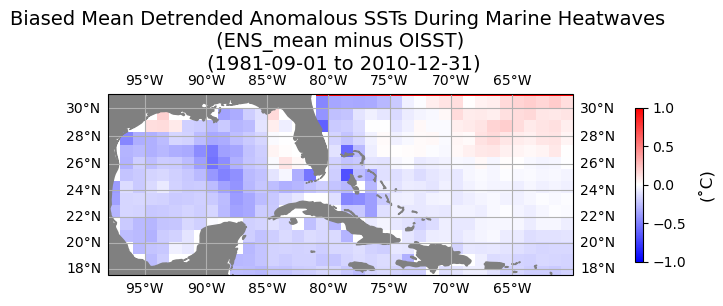

In [120]:
cartopy_plot_single(mean_mhw_tmp_bias_ens_mean_oi, 'bwr', '(˚C)', 
'Biased Mean Detrended Anomalous SSTs During Marine Heatwaves \n (ENS_mean minus OISST) \n (1981-09-01 to 2010-12-31)',
                    norm=mcolors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1));

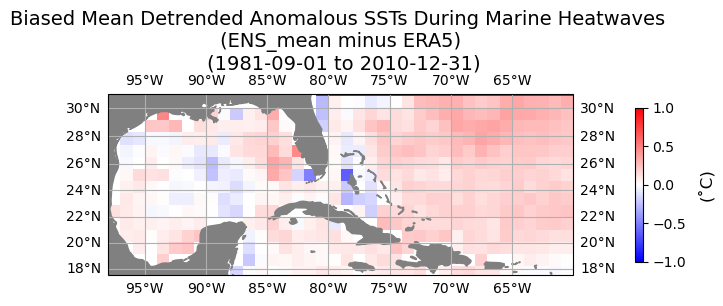

In [121]:
cartopy_plot_single(mean_mhw_tmp_bias_ens_mean_era, 'bwr', '(˚C)', 
'Biased Mean Detrended Anomalous SSTs During Marine Heatwaves \n (ENS_mean minus ERA5) \n (1981-09-01 to 2010-12-31)',
                    norm=mcolors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1));

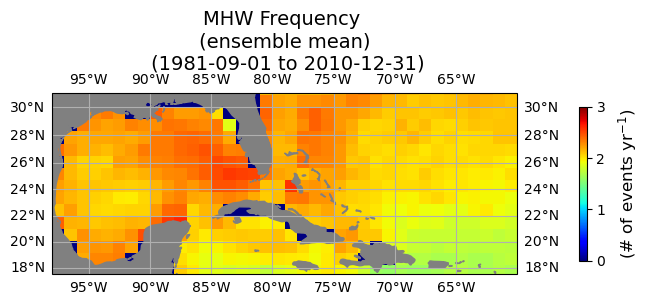

In [122]:
cartopy_plot_single(ev_freq_ens_mean, 'jet', r'(# of events yr$^{-1}$)', 
                    'MHW Frequency \n (ensemble mean) \n (1981-09-01 to 2010-12-31)',
                   vmin=0, vmax=3);

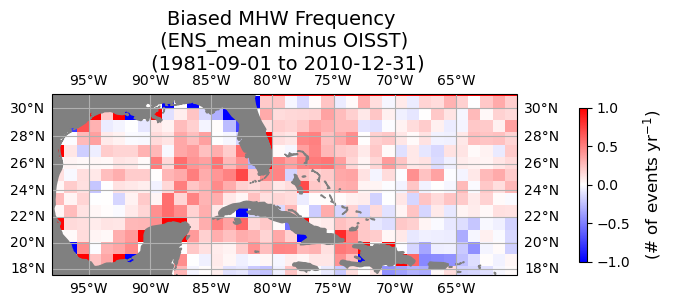

In [126]:
cartopy_plot_single(ev_freq_bias_ens_mean_oi, 'bwr', r'(# of events yr$^{-1}$)', 
                    'Biased MHW Frequency \n (ENS_mean minus OISST) \n (1981-09-01 to 2010-12-31)',
                   norm=mcolors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1));

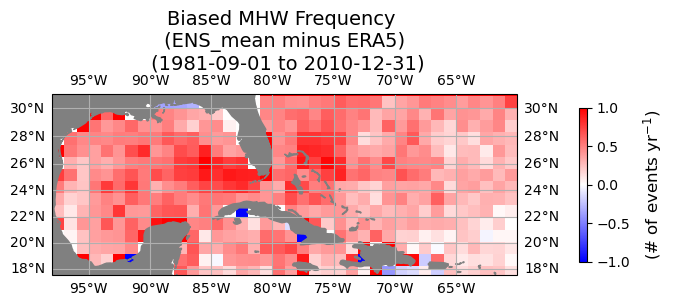

In [127]:
cartopy_plot_single(ev_freq_bias_ens_mean_era, 'bwr', r'(# of events yr$^{-1}$)', 
                    'Biased MHW Frequency \n (ENS_mean minus ERA5) \n (1981-09-01 to 2010-12-31)',
                   norm=mcolors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1));

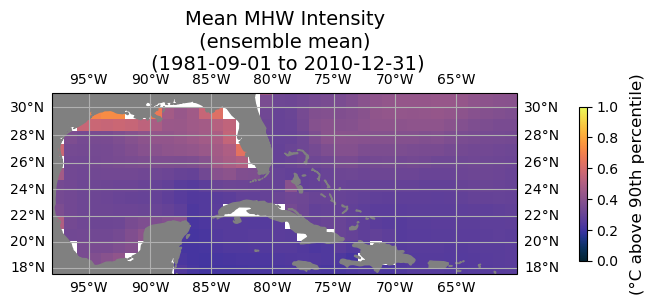

In [128]:
cartopy_plot_single(mhw_int_ens_mean, cmocean.cm.thermal, '(°C above 90th percentile)', 
             'Mean MHW Intensity\n (ensemble mean) \n (1981-09-01 to 2010-12-31)',
                    vmin=0, vmax=1);

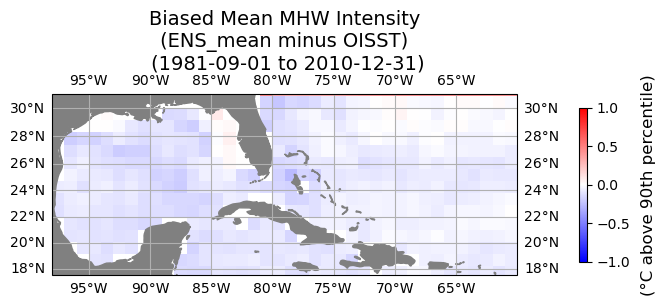

In [129]:
cartopy_plot_single(mhw_int_bias_ens_mean_oi, 'bwr', '(°C above 90th percentile)', 
             'Biased Mean MHW Intensity\n (ENS_mean minus OISST) \n (1981-09-01 to 2010-12-31)',
                    norm=mcolors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1));

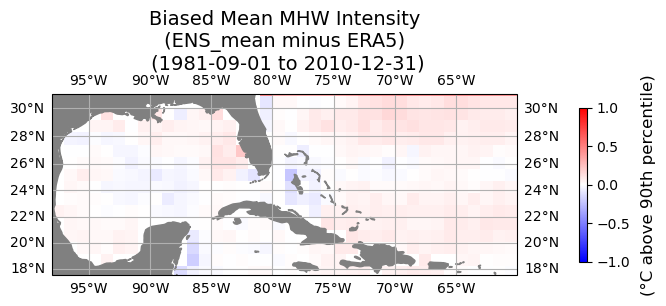

In [130]:
cartopy_plot_single(mhw_int_bias_ens_mean_era, 'bwr', '(°C above 90th percentile)', 
             'Biased Mean MHW Intensity\n (ENS_mean minus ERA5) \n (1981-09-01 to 2010-12-31)',
                    norm=mcolors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1));